PROGRAMMING QUESTION
PLEASE READ BELOW CAREFULLY
- Please read and implement the below problem in Jupyter Notebook environment. Your final notebook code should be presenting your ideas and results in a concise way.
- After finishing the task, you should upload the notebook (and other essential things if there are) to your favourite git provider (github, bitbucket, gitlab ... etc.) as a publicly accessible code repository. 
- Paste the URL of the solution repository to your solutions document as answer to 17th question. 
- If you are selected to proceed to technical interview, you will be responsible to explain and discuss your algorithm in detail on notebook.
- If you think there is an ambiguity in the task from your point of view, please write down the ambiguity, the cause of it and your reasoning to accept your assumption to solve this ambiguity in the notebook.

TASK: Forecasting bus demand in Banana Republic municipalities.

The central urban planning commitee of Banana Republic asked you to help them with the forecast of bus demands of municipalities. And they provide a nice dataset to support you (https://pi.works/3w8IJbV). 
The dataset includes two measurements for an hour for the number of used buses in each municipality, each measurement is timestamped. The dataset format is as follows (comma separated values):
MUNICIPALITY_ID, TIMESTAMP, USAGE, TOTAL_CAPACITY
where 
* municipality_id is an anonymization to disguise the actual names,  
* timestamp represents the exact time of the measurement, 
* usage is the number of buses in use at the time of measurement and 
* total_capacity represents the total number of buses in the municipality.
 There are 10 municipalities (ids from 0 to 9), and two measurements for an hour.

The committee asks you to **forecast the hourly bus usages for next week for each municipality**. Hence you can aggregate the two measurements for an hour by taking the max value (sum would not be a nice idea for the obvious reasons) for each hour, and you should model this data with a time series model of your selection. (It would be a nice idea to implement a very simple baseline model first, and then try to improve the accuracy by introducing more complex methods eventually. The bare minimum requirement of the task is one simple baseline and one complex method.)
The committee says that they will use the last two weeks (starting from 2017-08-05 to 2017-08-19) as assessment (test) data, hence your code should report the error (in the criterion you chose for the task) for the last two weeks. You may use true values for the prediction of the last week of test data, then combine the error of the first and last week of the test separately.
Keep in mind that the dataset has missing data, hence a suitable missing data interpolation would be useful.

#Read data

In [ ]:
pip install sktime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from os import listdir
import seaborn as sns
from google.colab import drive
import warnings
import sys, os
import scipy.io
import scipy
import pywt
from scipy.signal import welch
from scipy.signal import butter,filtfilt
from scipy.signal import hilbert
from scipy.io import loadmat
from sklearn.metrics import confusion_matrix
import seaborn as sns


import tensorflow as tf

from sklearn.metrics import accuracy_score
from tensorflow.keras.optimizers import Adam
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras import Model, Sequential
from sklearn.model_selection import train_test_split
from tensorflow.keras.losses import MeanSquaredLogarithmicError
from scipy.io import loadmat
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score


from sklearn.model_selection import train_test_split
from sklearn import preprocessing

from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn import model_selection, naive_bayes, svm

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
%load_ext google.colab.data_table
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score, mean_squared_error

from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input, Flatten, Dense
from keras.models import Model, load_model
import tensorflow
import random
import keras

from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from matplotlib import pyplot
from keras.models import Sequential
from keras.layers import Dropout
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D


import sklearn.metrics as metrics
from sklearn.metrics import make_scorer
# evaluate a logistic regression model using k-fold cross-validation
from sklearn.datasets import make_classification
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

from sktime.forecasting.model_selection import temporal_train_test_split

warnings.filterwarnings("ignore")
drive.mount('/content/gdrive')
#drive.mount('./drive', force_remount=True)
sns.set()

path_prefix = "./gdrive/My Drive/PI Works/"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
data= pd.read_csv(path_prefix+"municipality_bus_utilization.csv")

In [ ]:
"""
import pandas as pd
import numpy as np

# Load the data into a Pandas DataFrame
df = pd.read_csv("hourly_bus_usage.csv")

# Clean and pre-process the data
# Handle missing values with interpolation
df = df.interpolate()

# Aggregate the usage measurements for each hour by taking the maximum value
df = df.groupby([df['municipality_id'], df['timestamp'].dt.hour]).max().reset_index()

# Split the data into training and test sets
# Use the last two weeks as the test data
split_date = '2017-08-19'
train = df[df['timestamp'] <= split_date]
test = df[df['timestamp'] > split_date]

# Train a simple moving average model on the training data
window_size = 24 # one day
predictions = []
for municipality_id in train['municipality_id'].unique():
    municipality_data = train[train['municipality_id'] == municipality_id]['usage']
    for i in range(len(test)):
        moving_avg = np.mean(municipality_data[i:i+window_size])
        predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")
"""

'\nimport pandas as pd\nimport numpy as np\n\n# Load the data into a Pandas DataFrame\ndf = pd.read_csv("hourly_bus_usage.csv")\n\n# Clean and pre-process the data\n# Handle missing values with interpolation\ndf = df.interpolate()\n\n# Aggregate the usage measurements for each hour by taking the maximum value\ndf = df.groupby([df[\'municipality_id\'], df[\'timestamp\'].dt.hour]).max().reset_index()\n\n# Split the data into training and test sets\n# Use the last two weeks as the test data\nsplit_date = \'2017-08-19\'\ntrain = df[df[\'timestamp\'] <= split_date]\ntest = df[df[\'timestamp\'] > split_date]\n\n# Train a simple moving average model on the training data\nwindow_size = 24 # one day\npredictions = []\nfor municipality_id in train[\'municipality_id\'].unique():\n    municipality_data = train[train[\'municipality_id\'] == municipality_id][\'usage\']\n    for i in range(len(test)):\n        moving_avg = np.mean(municipality_data[i:i+window_size])\n        predictions.append(moving

In [ ]:
from datetime import datetime
for d in range(len(data["timestamp"])): 
  data['timestamp'][d]= datetime.strptime(data['timestamp'][d], "%Y-%m-%d %H:%M:%S").replace(minute=0, second=0, microsecond=0)

In [ ]:
data=data.sort_values(by=['timestamp'])
data

,timestamp,municipality_id,usage,total_capacity
0,2017-06-04 07:00:00,9,454,1332
8,2017-06-04 07:00:00,6,597,3113
7,2017-06-04 07:00:00,1,129,397
6,2017-06-04 07:00:00,2,273,697
5,2017-06-04 07:00:00,5,70,587
...,...,...,...,...
13051,2017-08-19 16:00:00,6,1727,3113
13050,2017-08-19 16:00:00,4,2779,3893
13068,2017-08-19 16:00:00,6,1680,3113
13058,2017-08-19 16:00:00,8,1253,2947


In [ ]:
df=data.groupby([data['municipality_id'], data['timestamp']]).max().reset_index()
df

,municipality_id,timestamp,usage,total_capacity
0,0,2017-06-04 07:00:00,204,2813
1,0,2017-06-04 08:00:00,332,2813
2,0,2017-06-04 09:00:00,485,2813
3,0,2017-06-04 10:00:00,583,2813
4,0,2017-06-04 11:00:00,614,2813
...,...,...,...,...
6735,9,2017-08-19 12:00:00,849,1332
6736,9,2017-08-19 13:00:00,941,1332
6737,9,2017-08-19 14:00:00,983,1332
6738,9,2017-08-19 15:00:00,976,1332


In [ ]:
data0=df.loc[df.municipality_id==0]
print(pd.unique(data0["total_capacity"]))

data1=df.loc[df.municipality_id==1]
print(pd.unique(data1["total_capacity"]))

data2=df.loc[df.municipality_id==2]
print(pd.unique(data2["total_capacity"]))

data3=df.loc[df.municipality_id==3]
print(pd.unique(data3["total_capacity"]))

data4=df.loc[df.municipality_id==4]
print(pd.unique(data4["total_capacity"]))

data5=df.loc[df.municipality_id==5]
print(pd.unique(data5["total_capacity"]))

data6=df.loc[df.municipality_id==6]
print(pd.unique(data6["total_capacity"]))

data7=df.loc[df.municipality_id==7]
print(pd.unique(data7["total_capacity"]))

data8=df.loc[df.municipality_id==8]
print(pd.unique(data8["total_capacity"]))

data9=df.loc[df.municipality_id==9]
print(pd.unique(data9["total_capacity"]))

[2813]
[397]
[697]
[1930]
[3893]
[587]
[3113]
[2019]
[2947]
[1332]


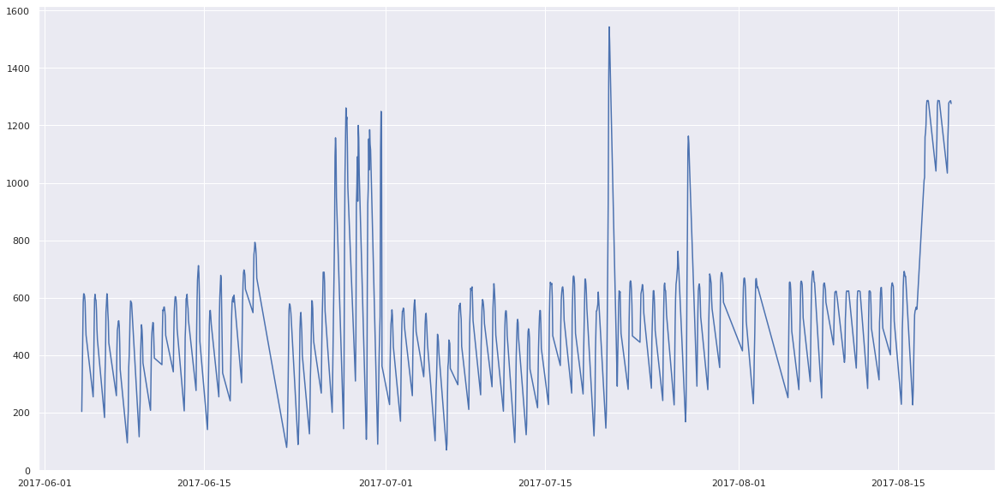

In [ ]:
plt.figure(figsize=(20,10))
plt.plot(data0.timestamp,data0.usage)

In [ ]:
def create_hourly_timeseries():
    start = pd.Timestamp("2017-06-04 07:00:00")
    end = pd.Timestamp("2017-08-19 16:00:00")
    idx = pd.date_range(start, end, freq='H')
    idx = idx[(idx.hour >= 7) & (idx.hour <= 16)]
    return pd.Series(index=idx)

In [ ]:
dates=create_hourly_timeseries()
df_dates=pd.DataFrame(dates)

def create_interpolated_dataframes(df,df_dates,method):

  df=df.set_index("timestamp")
  df_all=pd.concat([df_dates, df], axis=1).drop(["municipality_id","dates","total_capacity",0],axis=1, errors="ignore")
  df_all_interpolated=df_all.interpolate(method=method)
  df_all_interpolated.reset_index(inplace=True)
  df_all_interpolated.columns=["date","usage"]

  return df_all_interpolated

In [ ]:
method='linear'
df0=create_interpolated_dataframes(data0,df_dates,method)
df1=create_interpolated_dataframes(data1,df_dates,method)
df2=create_interpolated_dataframes(data2,df_dates,method)
df3=create_interpolated_dataframes(data3,df_dates,method)
df4=create_interpolated_dataframes(data4,df_dates,method)
df5=create_interpolated_dataframes(data5,df_dates,method)
df6=create_interpolated_dataframes(data6,df_dates,method)
df7=create_interpolated_dataframes(data7,df_dates,method)
df8=create_interpolated_dataframes(data8,df_dates,method)
df9=create_interpolated_dataframes(data9,df_dates,method)

In [ ]:
split_date='2017-08-05'
split_index= df0.index[df0['date'] >= split_date].tolist()[0] #'2017-08-05'   
#620

In [ ]:
train0=df0[:split_index]
test0=df0[split_index:]

In [ ]:
y=df0.usage
from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=len(df0)-split_index)

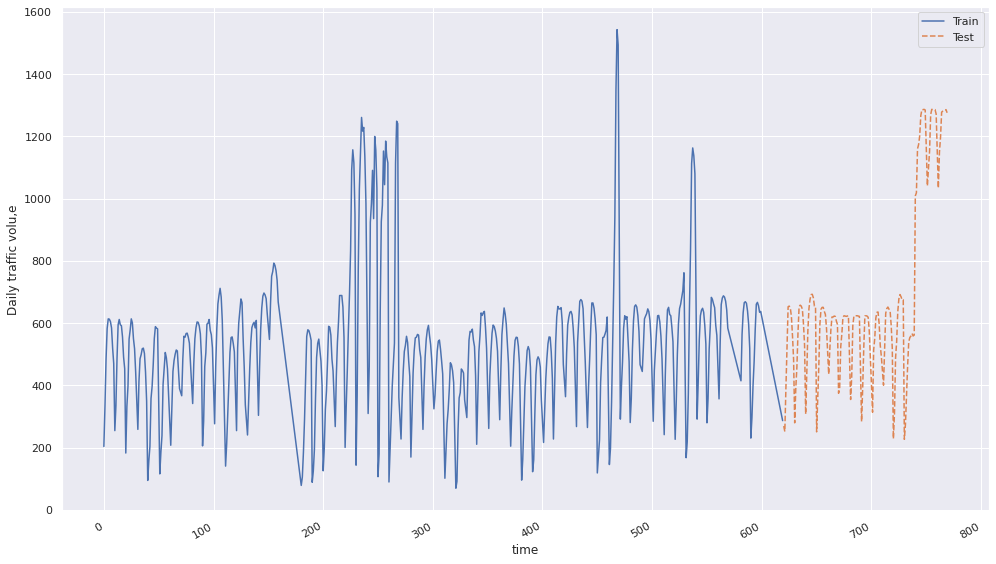

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
pip install tbats

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


#Municipality 0

In [ ]:
df_mun=df0

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

Mean absolute error: 241.20303030303023


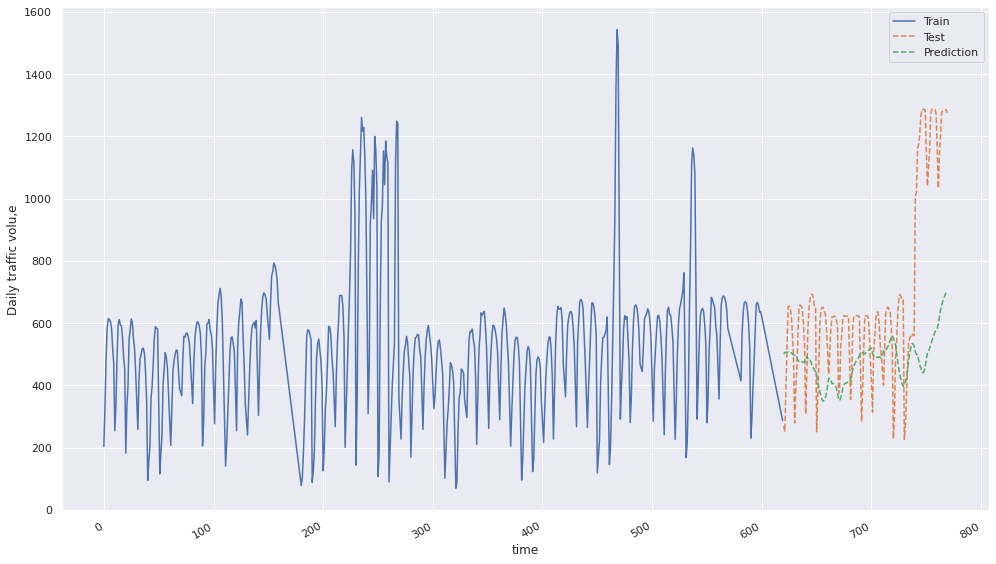

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

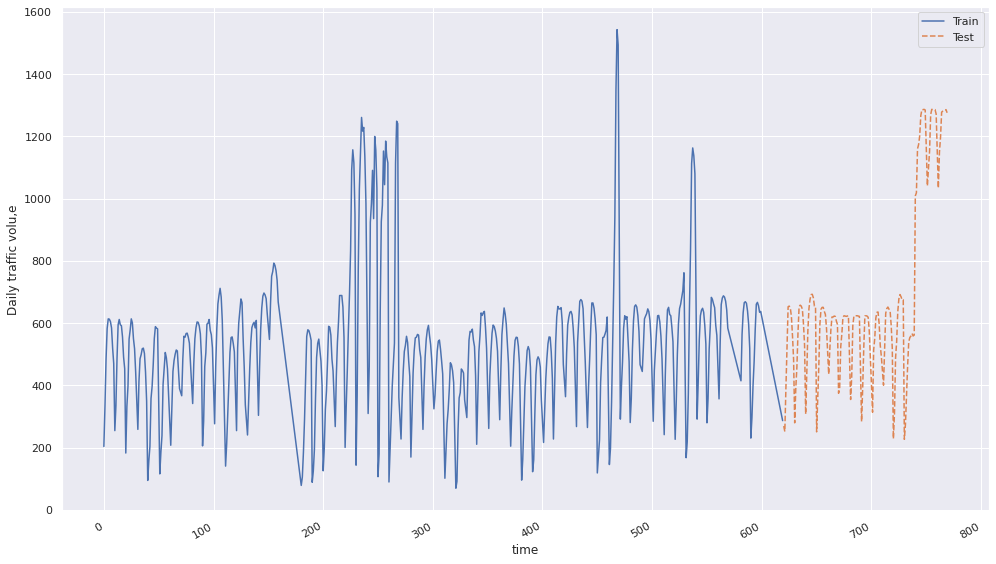

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 340.8661055618999


In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 367.3141737445429


In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

Mean absolute error: 219.51777777777775


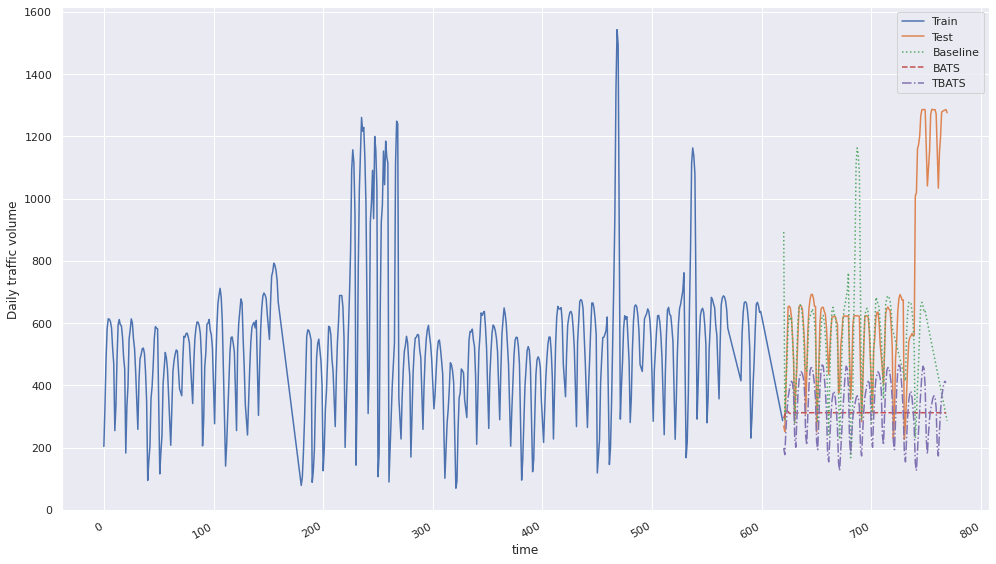

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


                               SARIMAX Results                                
Dep. Variable:                  usage   No. Observations:                  770
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -4754.140
Date:                Thu, 02 Feb 2023   AIC                           9520.280
Time:                        13:28:16   BIC                           9548.151
Sample:                             0   HQIC                          9531.007
                                - 770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2356      0.021     11.220      0.000       0.194       0.277
ar.L2         -0.1230      0.031     -3.930      0.000      -0.184      -0.062
ar.L3         -0.2370      0.030     -7.856      0.0

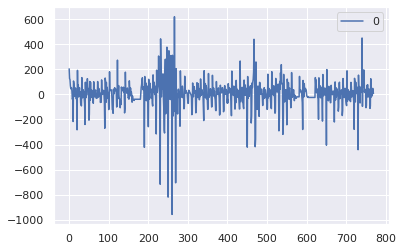

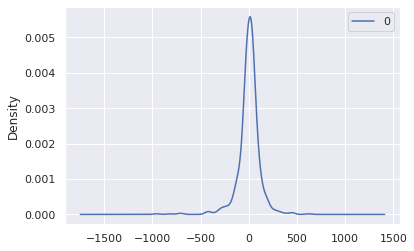

                0
count  770.000000
mean     2.157740
std    117.329232
min   -958.191710
25%    -34.283396
50%     11.543411
75%     48.245096
max    620.029171


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 98.347
Test MAE: 64.254


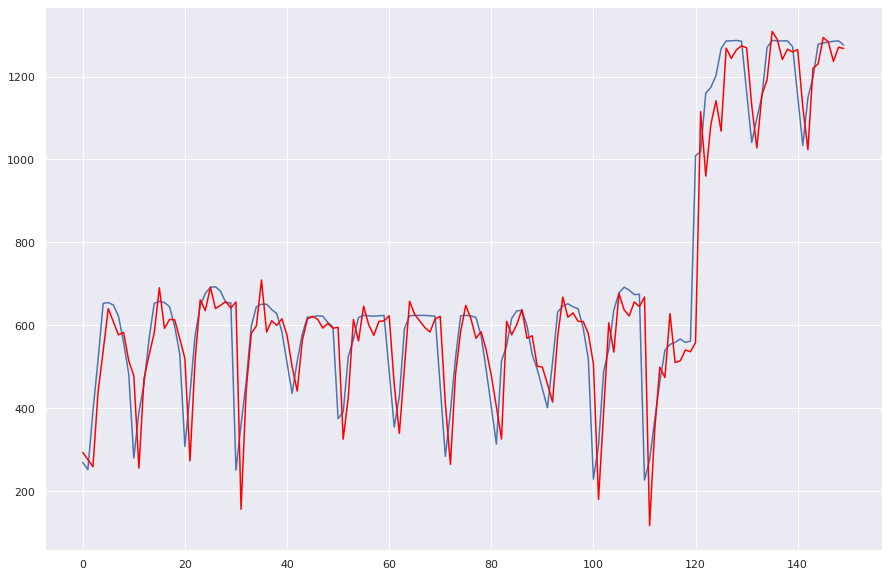

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 87.367
Test MAE: 52.867


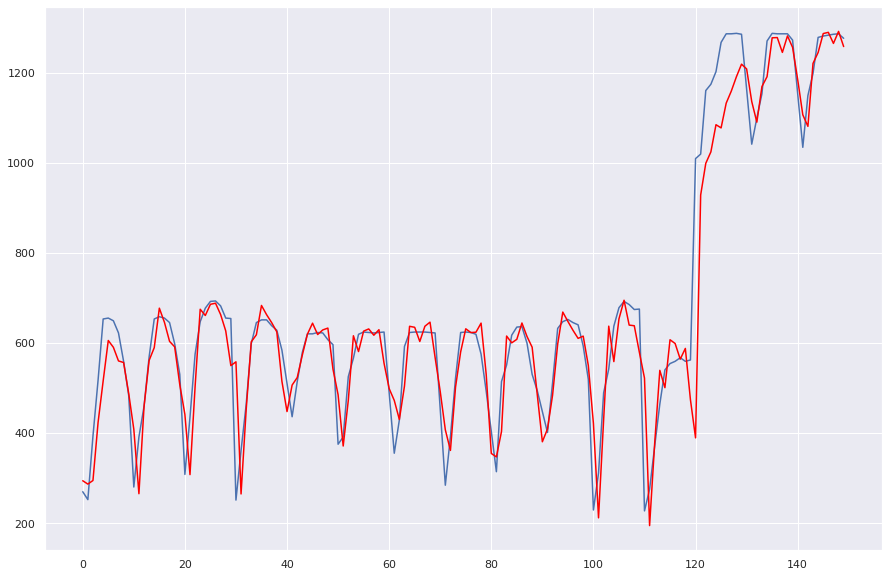

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 3s - loss: 0.0149 - 3s/epoch - 5ms/step
Epoch 2/100
609/609 - 2s - loss: 0.0139 - 2s/epoch - 3ms/step
Epoch 3/100
609/609 - 2s - loss: 0.0130 - 2s/epoch - 3ms/step
Epoch 4/100
609/609 - 2s - loss: 0.0119 - 2s/epoch - 3ms/step
Epoch 5/100
609/609 - 2s - loss: 0.0105 - 2s/epoch - 3ms/step
Epoch 6/100
609/609 - 2s - loss: 0.0084 - 2s/epoch - 3ms/step
Epoch 7/100
609/609 - 2s - loss: 0.0067 - 2s/epoch - 2ms/step
Epoch 8/100
609/609 - 2s - loss: 0.0061 - 2s/epoch - 3ms/step
Epoch 9/100
609/609 - 2s - loss: 0.0060 - 2s/epoch - 2ms/step
Epoch 10/100
609/609 - 2s - loss: 0.0059 - 2s/epoch - 3ms/step
Epoch 11/100
609/609 - 2s - loss: 0.0059 - 2s/epoch - 3ms/step
Epoch 12/100
609/609 - 2s - loss: 0.0056 - 2s/epoch - 3ms/step
Epoch 13/100
609/609 - 2s - loss: 0.0058 - 2s/epoch - 3ms/step
Epoch 14/100
609/609 - 2s - loss: 0.0057 - 2s/epoch - 3ms/step
Epoch 15/100
609/609 - 2s - loss: 0.0056 - 2s/epoch - 3ms/step
Epoch 16/100
609/609 - 2s - loss: 0.0056 - 2s/epoch - 3ms/step
E

Train Score: 93.58 RMSE
Test Score: 130.89 RMSE
Test Score: 9.31 MAE


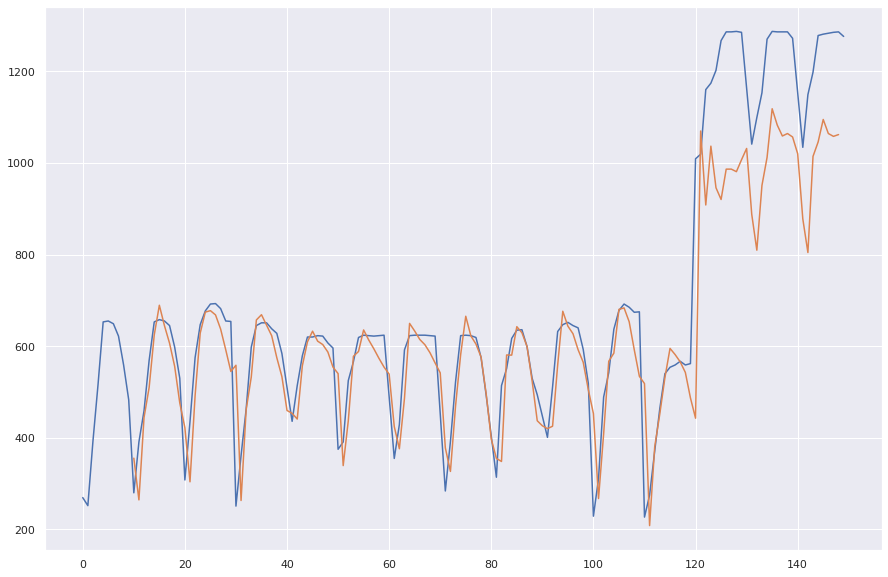

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 7s - loss: 0.0213 - 7s/epoch - 11ms/step
Epoch 2/100
609/609 - 4s - loss: 0.0135 - 4s/epoch - 6ms/step
Epoch 3/100
609/609 - 4s - loss: 0.0085 - 4s/epoch - 6ms/step
Epoch 4/100
609/609 - 4s - loss: 0.0068 - 4s/epoch - 6ms/step
Epoch 5/100
609/609 - 4s - loss: 0.0060 - 4s/epoch - 6ms/step
Epoch 6/100
609/609 - 4s - loss: 0.0057 - 4s/epoch - 6ms/step
Epoch 7/100
609/609 - 4s - loss: 0.0063 - 4s/epoch - 6ms/step
Epoch 8/100
609/609 - 4s - loss: 0.0057 - 4s/epoch - 7ms/step
Epoch 9/100
609/609 - 4s - loss: 0.0056 - 4s/epoch - 6ms/step
Epoch 10/100
609/609 - 4s - loss: 0.0053 - 4s/epoch - 6ms/step
Epoch 11/100
609/609 - 4s - loss: 0.0057 - 4s/epoch - 6ms/step
Epoch 12/100
609/609 - 4s - loss: 0.0054 - 4s/epoch - 6ms/step
Epoch 13/100
609/609 - 4s - loss: 0.0052 - 4s/epoch - 6ms/step
Epoch 14/100
609/609 - 4s - loss: 0.0052 - 4s/epoch - 6ms/step
Epoch 15/100
609/609 - 4s - loss: 0.0048 - 4s/epoch - 6ms/step
Epoch 16/100
609/609 - 4s - loss: 0.0046 - 4s/epoch - 6ms/step


Train Score: 61.42 RMSE
Test Score: 152.90 RMSE
Test Score: 9.54 MAE


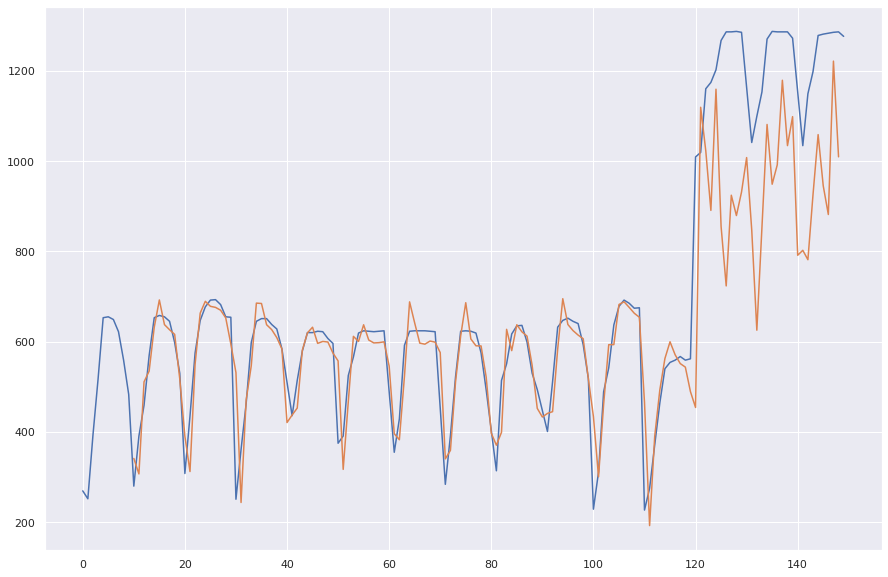

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 1

In [ ]:
df_mun=df1

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

Mean absolute error: 99.79639393939392


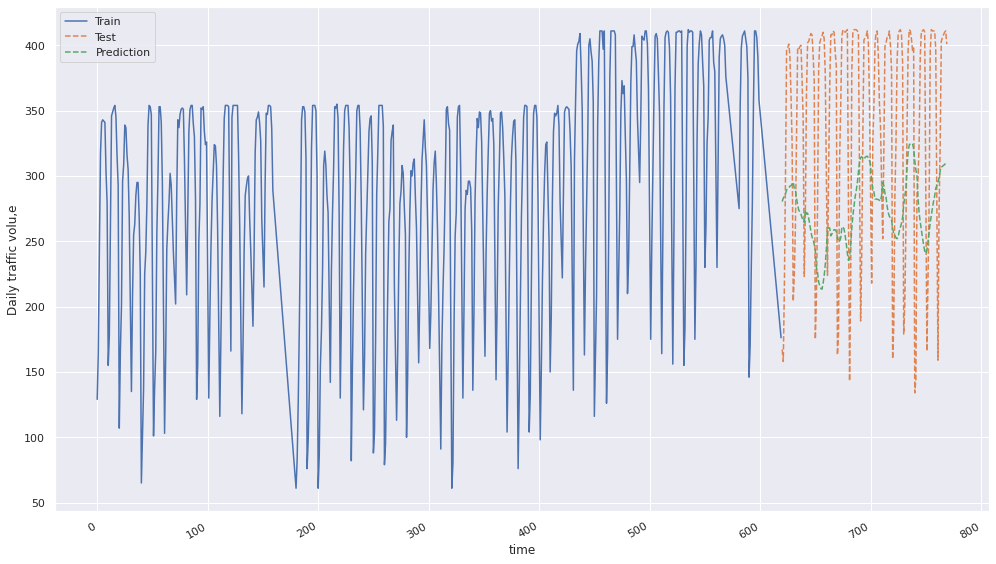

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

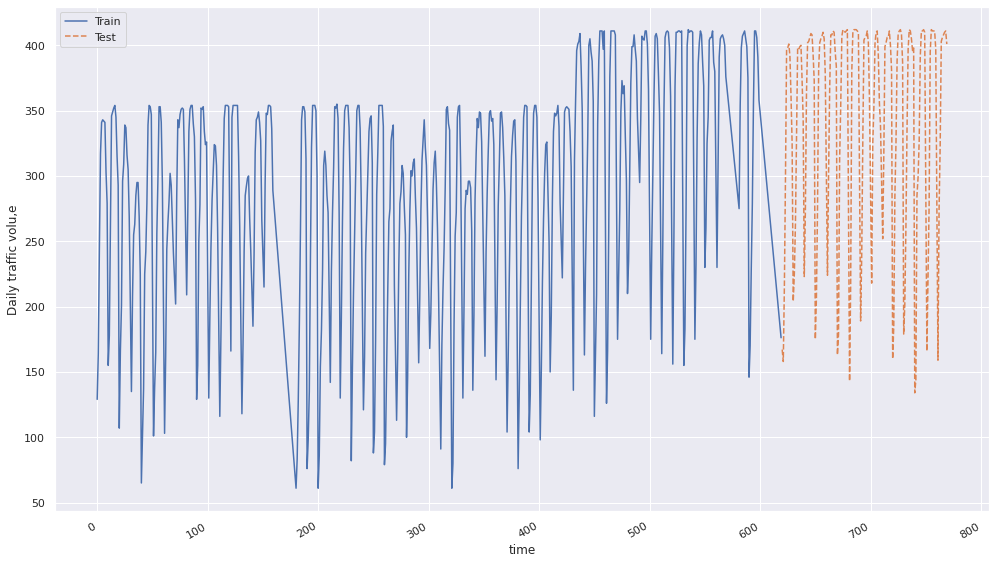

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 178.86155692863602


In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 51.132715810785264


In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

Mean absolute error: 40.68000000000001


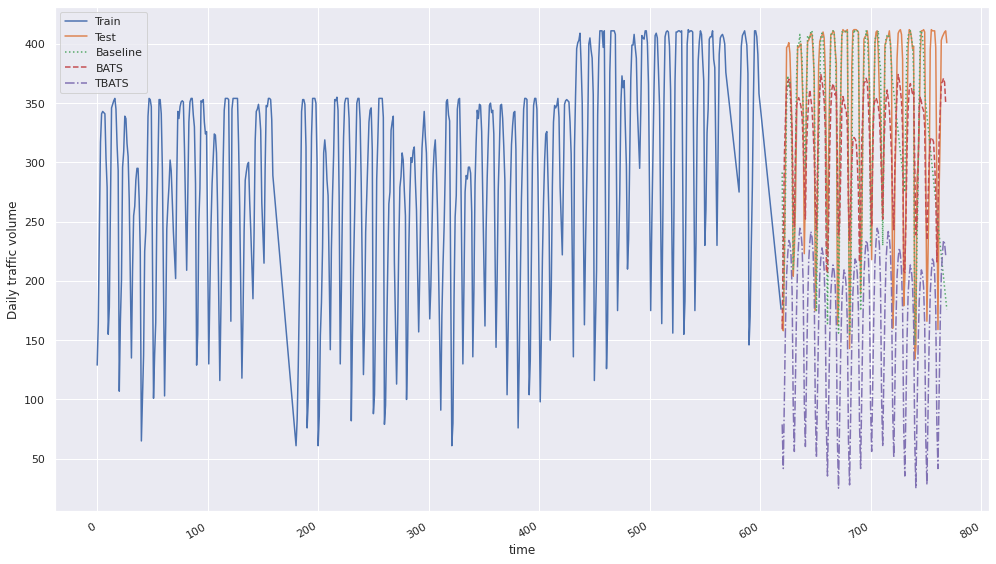

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


                               SARIMAX Results                                
Dep. Variable:                  usage   No. Observations:                  770
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -4136.042
Date:                Thu, 02 Feb 2023   AIC                           8284.084
Time:                        14:13:23   BIC                           8311.955
Sample:                             0   HQIC                          8294.811
                                - 770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2835      0.029      9.921      0.000       0.228       0.340
ar.L2         -0.2237      0.046     -4.862      0.000      -0.314      -0.133
ar.L3         -0.1480      0.051     -2.894      0.0

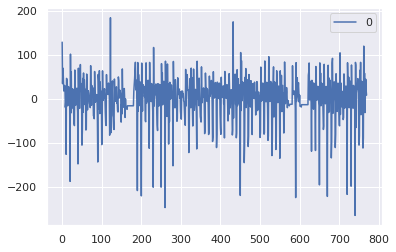

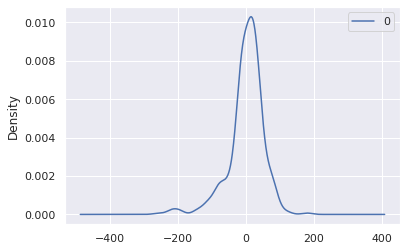

                0
count  770.000000
mean     0.641549
std     52.627930
min   -264.216763
25%    -15.391422
50%      8.723451
75%     30.694784
max    184.449481


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 62.495
Test MAE: 43.863


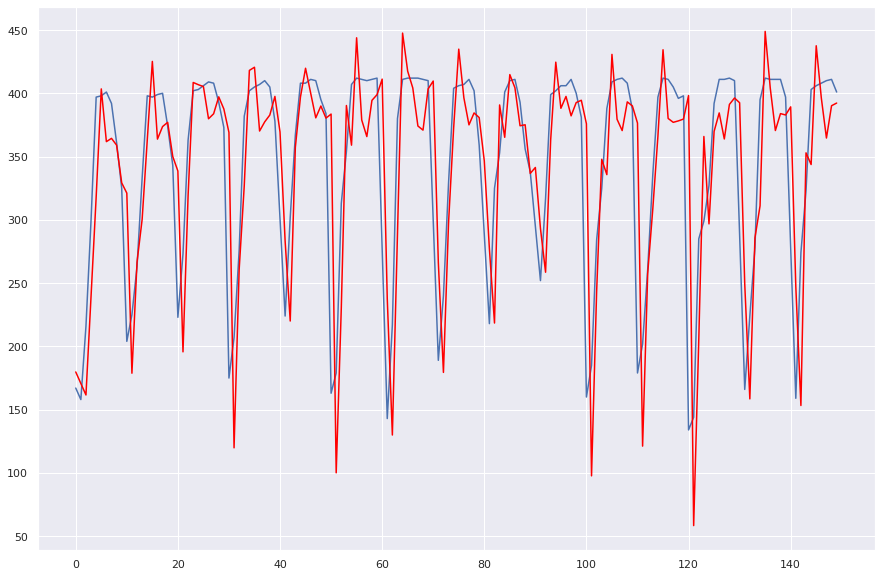

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 38.491
Test MAE: 26.547


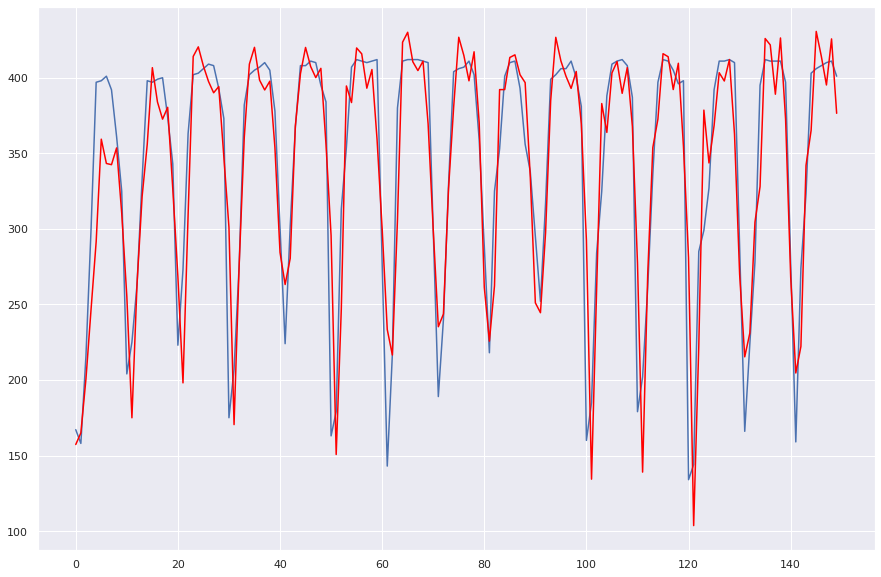

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 3s - loss: 0.0822 - 3s/epoch - 5ms/step
Epoch 2/100
609/609 - 2s - loss: 0.0465 - 2s/epoch - 3ms/step
Epoch 3/100
609/609 - 2s - loss: 0.0444 - 2s/epoch - 3ms/step
Epoch 4/100
609/609 - 2s - loss: 0.0422 - 2s/epoch - 3ms/step
Epoch 5/100
609/609 - 2s - loss: 0.0400 - 2s/epoch - 3ms/step
Epoch 6/100
609/609 - 2s - loss: 0.0381 - 2s/epoch - 3ms/step
Epoch 7/100
609/609 - 2s - loss: 0.0353 - 2s/epoch - 3ms/step
Epoch 8/100
609/609 - 2s - loss: 0.0303 - 2s/epoch - 3ms/step
Epoch 9/100
609/609 - 2s - loss: 0.0198 - 2s/epoch - 3ms/step
Epoch 10/100
609/609 - 2s - loss: 0.0173 - 2s/epoch - 3ms/step
Epoch 11/100
609/609 - 2s - loss: 0.0167 - 2s/epoch - 3ms/step
Epoch 12/100
609/609 - 2s - loss: 0.0156 - 2s/epoch - 3ms/step
Epoch 13/100
609/609 - 2s - loss: 0.0153 - 2s/epoch - 3ms/step
Epoch 14/100
609/609 - 2s - loss: 0.0152 - 2s/epoch - 3ms/step
Epoch 15/100
609/609 - 2s - loss: 0.0146 - 2s/epoch - 3ms/step
Epoch 16/100
609/609 - 2s - loss: 0.0145 - 2s/epoch - 3ms/step
E

Train Score: 33.77 RMSE
Test Score: 40.59 RMSE
Test Score: 5.22 MAE


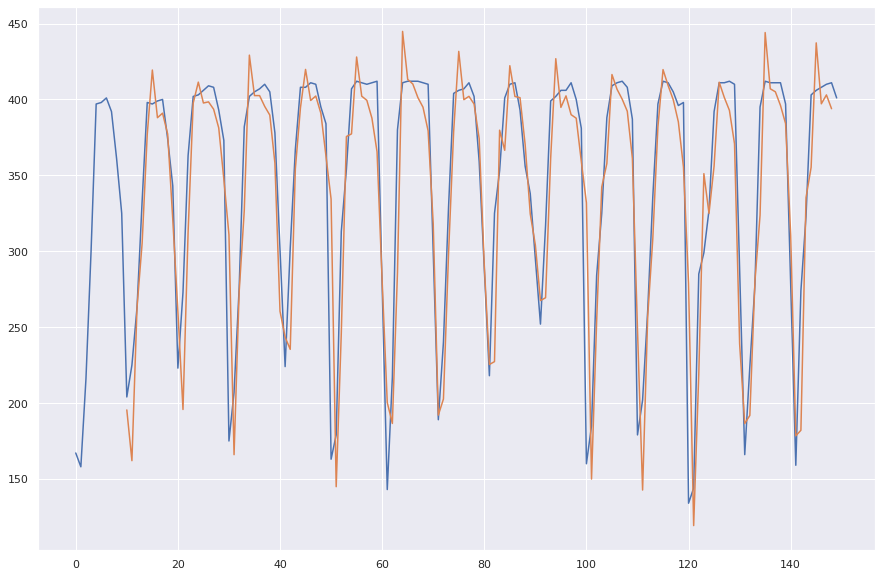

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 7s - loss: 0.0590 - 7s/epoch - 11ms/step
Epoch 2/100
609/609 - 4s - loss: 0.0231 - 4s/epoch - 6ms/step
Epoch 3/100
609/609 - 4s - loss: 0.0170 - 4s/epoch - 6ms/step
Epoch 4/100
609/609 - 4s - loss: 0.0147 - 4s/epoch - 6ms/step
Epoch 5/100
609/609 - 4s - loss: 0.0129 - 4s/epoch - 6ms/step
Epoch 6/100
609/609 - 4s - loss: 0.0131 - 4s/epoch - 6ms/step
Epoch 7/100
609/609 - 4s - loss: 0.0125 - 4s/epoch - 6ms/step
Epoch 8/100
609/609 - 4s - loss: 0.0114 - 4s/epoch - 6ms/step
Epoch 9/100
609/609 - 4s - loss: 0.0115 - 4s/epoch - 6ms/step
Epoch 10/100
609/609 - 4s - loss: 0.0114 - 4s/epoch - 6ms/step
Epoch 11/100
609/609 - 4s - loss: 0.0114 - 4s/epoch - 6ms/step
Epoch 12/100
609/609 - 4s - loss: 0.0111 - 4s/epoch - 6ms/step
Epoch 13/100
609/609 - 4s - loss: 0.0108 - 4s/epoch - 6ms/step
Epoch 14/100
609/609 - 4s - loss: 0.0105 - 4s/epoch - 7ms/step
Epoch 15/100
609/609 - 4s - loss: 0.0106 - 4s/epoch - 6ms/step
Epoch 16/100
609/609 - 4s - loss: 0.0107 - 4s/epoch - 6ms/step


Train Score: 23.88 RMSE
Test Score: 42.30 RMSE
Test Score: 4.88 MAE


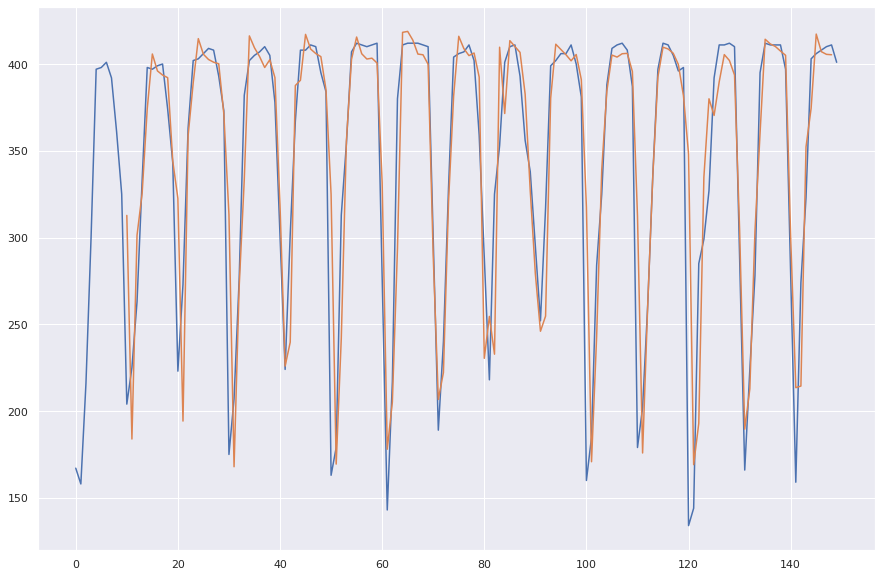

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 2

In [ ]:
df_mun=df2

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

Mean absolute error: 104.99951515151518


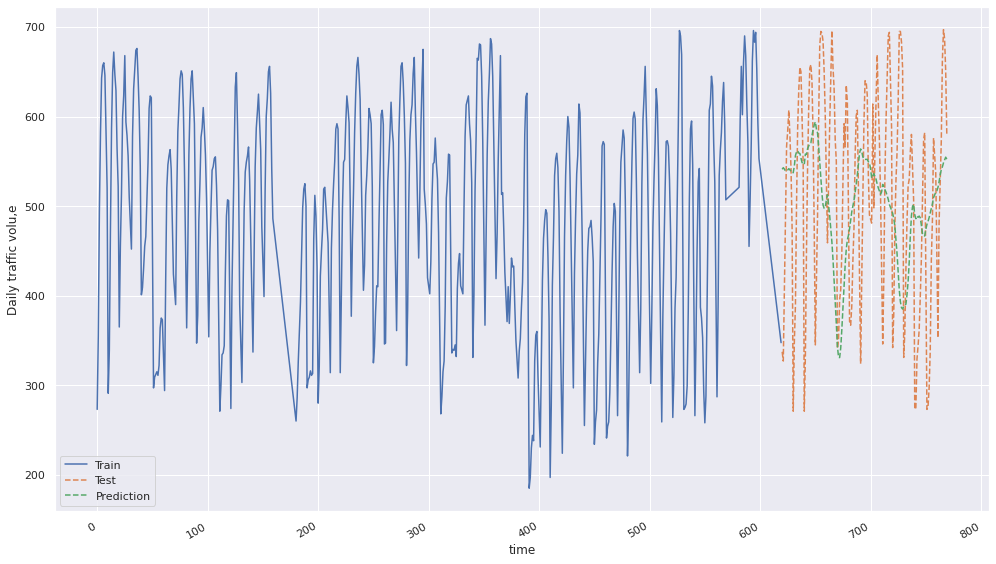

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

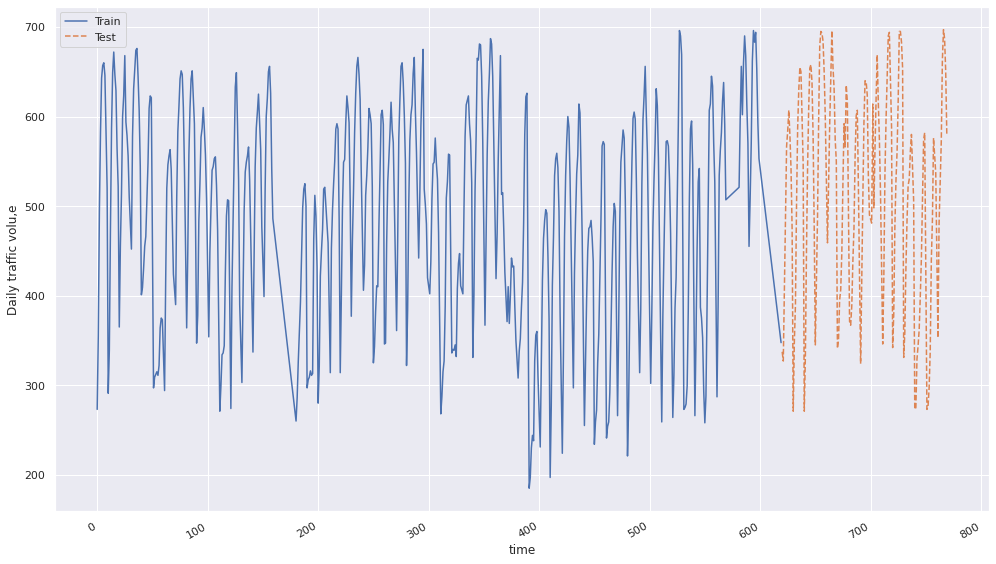

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 106.47232119415533


In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 74.02334504207522


In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

Mean absolute error: 97.53111111111112


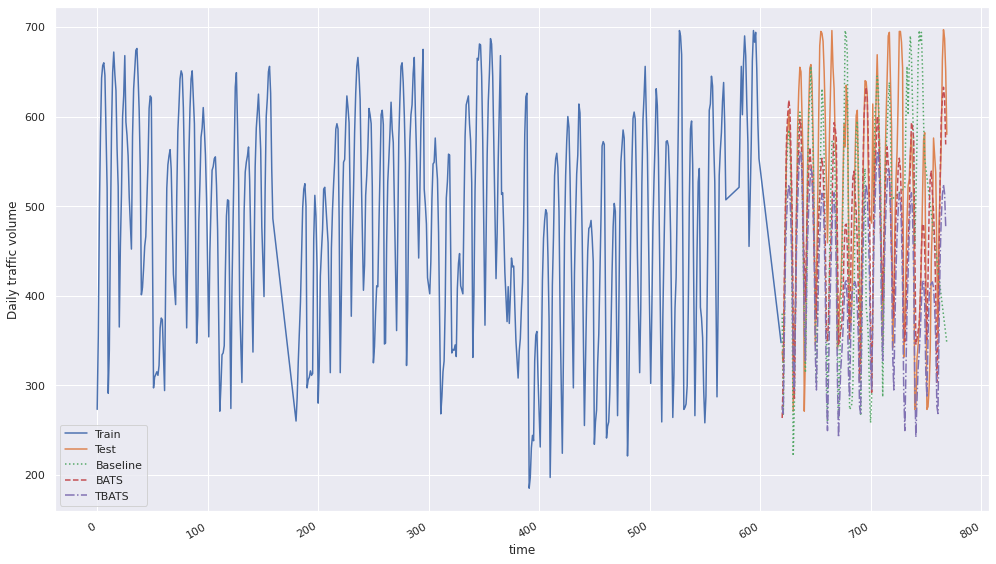

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


                               SARIMAX Results                                
Dep. Variable:                  usage   No. Observations:                  770
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -4220.402
Date:                Thu, 02 Feb 2023   AIC                           8452.804
Time:                        14:41:35   BIC                           8480.675
Sample:                             0   HQIC                          8463.531
                                - 770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3279      0.029     11.359      0.000       0.271       0.385
ar.L2         -0.1294      0.046     -2.827      0.005      -0.219      -0.040
ar.L3         -0.1216      0.056     -2.156      0.0

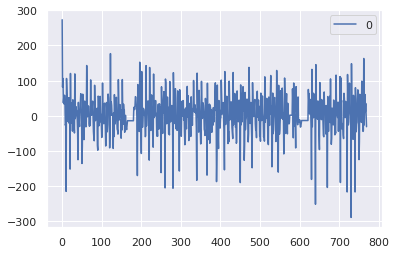

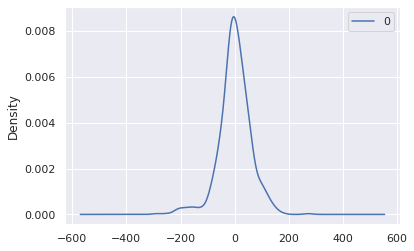

                0
count  770.000000
mean     0.858777
std     59.344856
min   -289.211524
25%    -25.822576
50%      1.370989
75%     34.749312
max    273.000000


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

predicted=350.337826, expected=337.272727
predicted=340.063010, expected=327.000000
predicted=329.788195, expected=405.000000
predicted=441.833835, expected=483.000000
predicted=504.713197, expected=567.000000
predicted=581.540302, expected=584.000000
predicted=559.964379, expected=607.000000
predicted=574.554218, expected=579.000000
predicted=532.345889, expected=542.000000
predicted=507.051660, expected=474.000000
predicted=449.811741, expected=271.000000
predicted=204.837492, expected=348.000000
predicted=430.595266, expected=389.000000
predicted=432.531995, expected=502.000000
predicted=572.527168, expected=587.000000
predicted=636.184199, expected=629.000000
predicted=593.792460, expected=655.000000
predicted=623.293584, expected=650.000000
predicted=600.389720, expected=599.000000
predicted=551.222003, expected=547.000000
predicted=522.191132, expected=271.000000
predicted=174.028057, expected=333.000000
predicted=410.484248, expected=450.000000
predicted=535.415497, expected=544

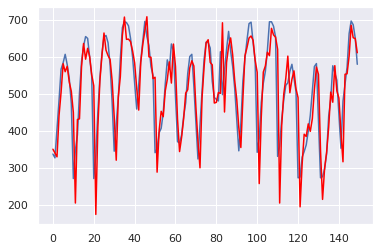

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 70.336
Test MAE: 47.664


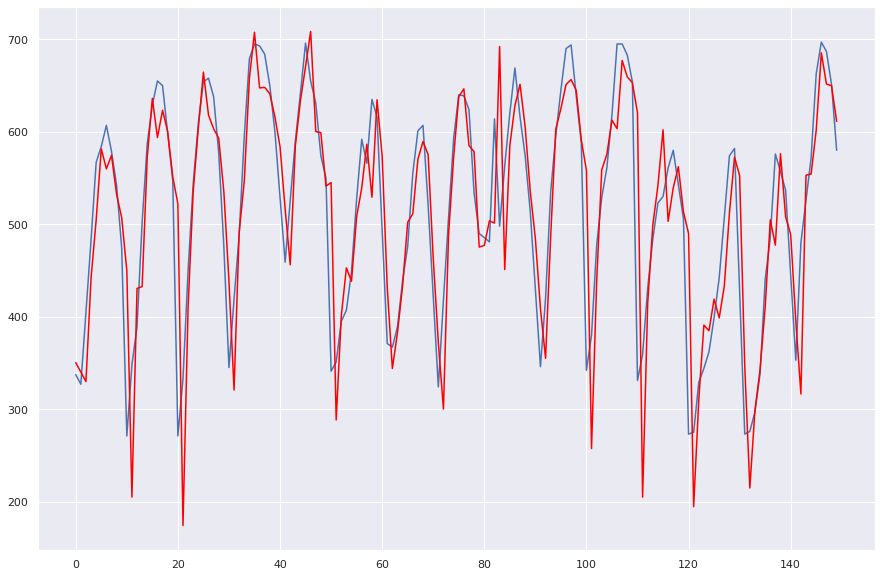

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=331.330795, expected=337.272727


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=351.174971, expected=327.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=370.776424, expected=405.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=439.842678, expected=483.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=472.693521, expected=567.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=549.204300, expected=584.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=569.307705, expected=607.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=584.098468, expected=579.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=526.699172, expected=542.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=475.126239, expected=474.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=406.395633, expected=271.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=233.846701, expected=348.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=418.628378, expected=389.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=462.131036, expected=502.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=563.753024, expected=587.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=627.938115, expected=629.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=636.147822, expected=655.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=633.749672, expected=650.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=587.054214, expected=599.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=498.971872, expected=547.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=450.036279, expected=271.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=214.115297, expected=333.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=422.015963, expected=450.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=541.822441, expected=544.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=617.597410, expected=609.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=670.960112, expected=654.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=658.801937, expected=658.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=632.971899, expected=638.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=585.972863, expected=577.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=478.637679, expected=476.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=365.926233, expected=345.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=326.584840, expected=419.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=515.737127, expected=488.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=584.844089, expected=595.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=661.711872, expected=679.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=703.903107, expected=695.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=672.440368, expected=693.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=661.080283, expected=684.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=617.291634, expected=650.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=551.447759, expected=600.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=517.204492, expected=529.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=525.149478, expected=459.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=500.481436, expected=526.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=605.602203, expected=590.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=633.317546, expected=642.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=651.611678, expected=696.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=699.087798, expected=655.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=645.472729, expected=631.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=613.140116, expected=574.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=507.776859, expected=550.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=491.563486, expected=341.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=314.336664, expected=351.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=426.277537, expected=395.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=472.523120, expected=407.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=475.680515, expected=449.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=519.543321, expected=527.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=566.063610, expected=592.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=608.471325, expected=566.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=567.176535, expected=635.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=576.034290, expected=616.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=505.797699, expected=493.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=443.126681, expected=371.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=384.842029, expected=367.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=379.349955, expected=389.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=409.806051, expected=439.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=497.419907, expected=476.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=524.112376, expected=555.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=604.039881, expected=601.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=632.007767, expected=607.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=570.633514, expected=521.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=431.328312, expected=422.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=348.863878, expected=324.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=328.787292, expected=418.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=454.633044, expected=507.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=541.802957, expected=593.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=649.965944, expected=640.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=668.861372, expected=639.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=628.889184, expected=624.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=592.280995, expected=534.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=451.330147, expected=490.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=386.565085, expected=485.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=456.947604, expected=481.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=538.421530, expected=614.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=693.289400, expected=498.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=507.805751, expected=563.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=570.667387, expected=620.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=609.363128, expected=669.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=656.295404, expected=616.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=601.763679, expected=574.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=525.732544, expected=514.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=441.000960, expected=430.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=421.267385, expected=346.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=409.630250, expected=420.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=486.679523, expected=535.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=579.502653, expected=596.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=638.643503, expected=645.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=672.673963, expected=690.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=671.567644, expected=694.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=656.802791, expected=639.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=558.768476, expected=588.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=485.453695, expected=342.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=287.912245, expected=380.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=434.947110, expected=477.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=574.472275, expected=529.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=588.834901, expected=561.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=623.214808, expected=618.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=657.146333, expected=695.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=687.000615, expected=695.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=655.972256, expected=683.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=600.381839, expected=654.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=527.820671, expected=331.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=251.768263, expected=359.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=414.832369, expected=431.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=495.847551, expected=484.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=555.074309, expected=523.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=600.410476, expected=530.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=573.738951, expected=561.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=590.875383, expected=580.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=572.346799, expected=543.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=477.584644, expected=506.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=418.571564, expected=273.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=232.549184, expected=275.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=324.631708, expected=329.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=413.535447, expected=344.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=412.542981, expected=362.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=408.181787, expected=399.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=434.632232, expected=442.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=488.910080, expected=507.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=510.664347, expected=574.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=529.786442, expected=582.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=476.005915, expected=427.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=354.226635, expected=273.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=261.966206, expected=276.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=307.033923, expected=297.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=315.293734, expected=338.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=372.858671, expected=440.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=500.217391, expected=485.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=556.026774, expected=576.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=616.950200, expected=557.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=500.282358, expected=537.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=426.224439, expected=445.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=343.925612, expected=353.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=326.451787, expected=480.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=521.358885, expected=526.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=540.997560, expected=572.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=587.953133, expected=663.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=667.563762, expected=697.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=706.378023, expected=687.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=661.042452, expected=651.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=573.325040, expected=580.000000
Test RMSE: 55.425
Test MAE: 39.603


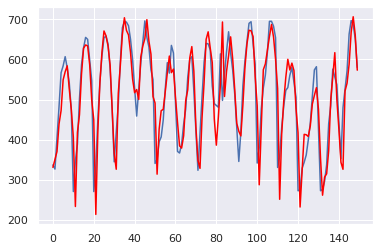

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 55.425
Test MAE: 39.603


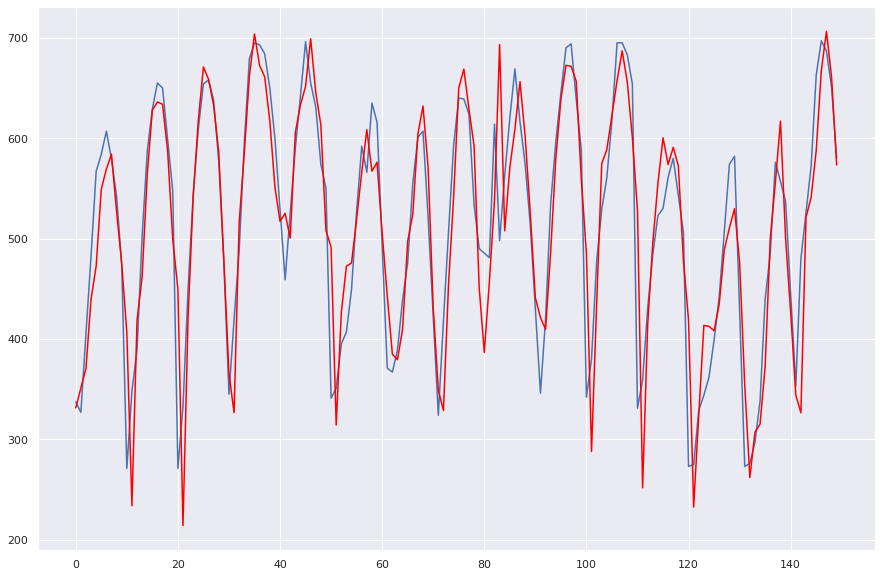

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 3s - loss: 0.0667 - 3s/epoch - 5ms/step
Epoch 2/100
609/609 - 2s - loss: 0.0326 - 2s/epoch - 3ms/step
Epoch 3/100
609/609 - 2s - loss: 0.0257 - 2s/epoch - 3ms/step
Epoch 4/100
609/609 - 2s - loss: 0.0216 - 2s/epoch - 3ms/step
Epoch 5/100
609/609 - 2s - loss: 0.0185 - 2s/epoch - 3ms/step
Epoch 6/100
609/609 - 2s - loss: 0.0173 - 2s/epoch - 3ms/step
Epoch 7/100
609/609 - 2s - loss: 0.0161 - 2s/epoch - 3ms/step
Epoch 8/100
609/609 - 2s - loss: 0.0148 - 2s/epoch - 3ms/step
Epoch 9/100
609/609 - 2s - loss: 0.0139 - 2s/epoch - 3ms/step
Epoch 10/100
609/609 - 2s - loss: 0.0130 - 2s/epoch - 3ms/step
Epoch 11/100
609/609 - 2s - loss: 0.0123 - 2s/epoch - 3ms/step
Epoch 12/100
609/609 - 2s - loss: 0.0122 - 2s/epoch - 3ms/step
Epoch 13/100
609/609 - 2s - loss: 0.0117 - 2s/epoch - 3ms/step
Epoch 14/100
609/609 - 2s - loss: 0.0116 - 2s/epoch - 3ms/step
Epoch 15/100
609/609 - 2s - loss: 0.0115 - 2s/epoch - 3ms/step
Epoch 16/100
609/609 - 2s - loss: 0.0112 - 2s/epoch - 3ms/step
E

Train Score: 49.36 RMSE
Test Score: 57.80 RMSE
Test Score: 6.33 MAE


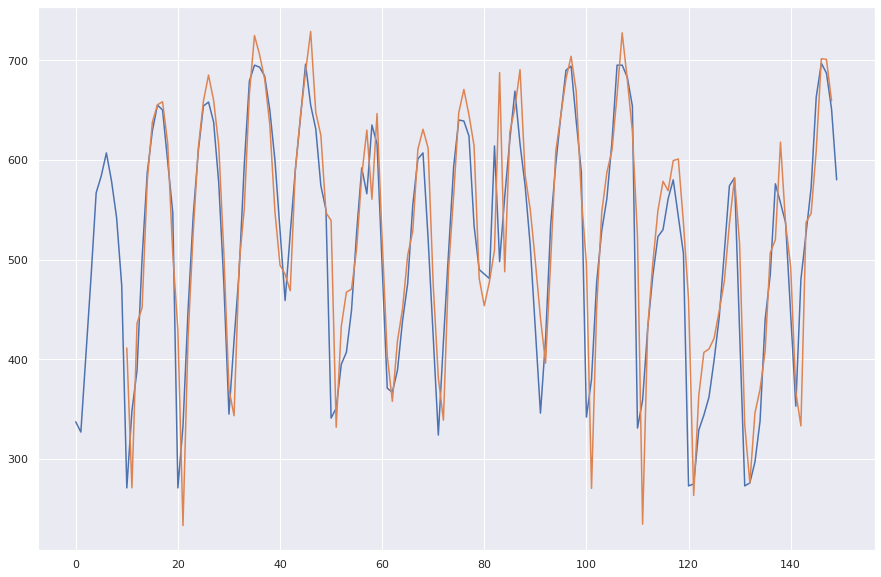

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 7s - loss: 0.0435 - 7s/epoch - 11ms/step
Epoch 2/100
609/609 - 4s - loss: 0.0168 - 4s/epoch - 6ms/step
Epoch 3/100
609/609 - 4s - loss: 0.0139 - 4s/epoch - 6ms/step
Epoch 4/100
609/609 - 4s - loss: 0.0112 - 4s/epoch - 6ms/step
Epoch 5/100
609/609 - 4s - loss: 0.0106 - 4s/epoch - 6ms/step
Epoch 6/100
609/609 - 4s - loss: 0.0106 - 4s/epoch - 6ms/step
Epoch 7/100
609/609 - 4s - loss: 0.0105 - 4s/epoch - 6ms/step
Epoch 8/100
609/609 - 4s - loss: 0.0101 - 4s/epoch - 6ms/step
Epoch 9/100
609/609 - 4s - loss: 0.0097 - 4s/epoch - 6ms/step
Epoch 10/100
609/609 - 4s - loss: 0.0094 - 4s/epoch - 6ms/step
Epoch 11/100
609/609 - 4s - loss: 0.0096 - 4s/epoch - 6ms/step
Epoch 12/100
609/609 - 4s - loss: 0.0095 - 4s/epoch - 6ms/step
Epoch 13/100
609/609 - 4s - loss: 0.0092 - 4s/epoch - 6ms/step
Epoch 14/100
609/609 - 4s - loss: 0.0093 - 4s/epoch - 6ms/step
Epoch 15/100
609/609 - 4s - loss: 0.0089 - 4s/epoch - 6ms/step
Epoch 16/100
609/609 - 4s - loss: 0.0090 - 4s/epoch - 6ms/step


Train Score: 25.88 RMSE
Test Score: 60.65 RMSE
Test Score: 6.79 MAE


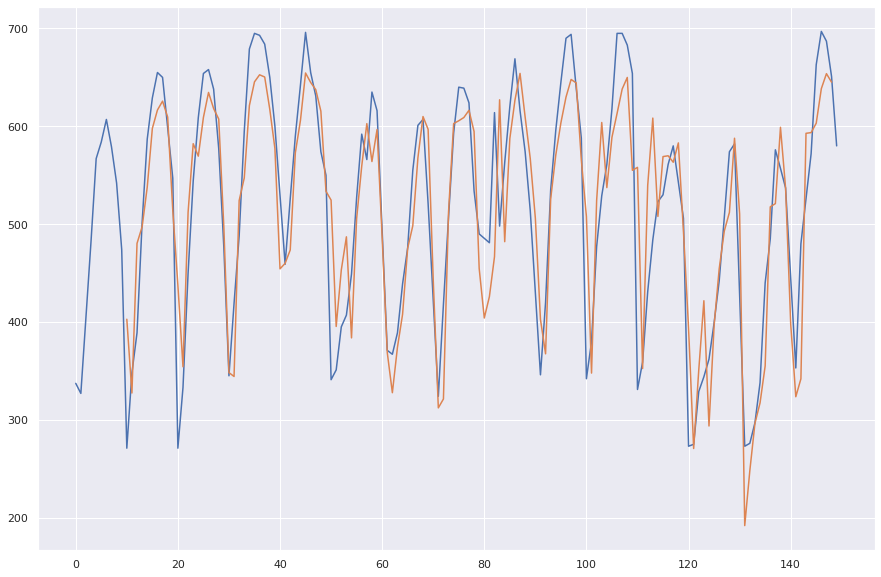

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 3

In [ ]:
df_mun=df3

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

Mean absolute error: 337.0075151515153


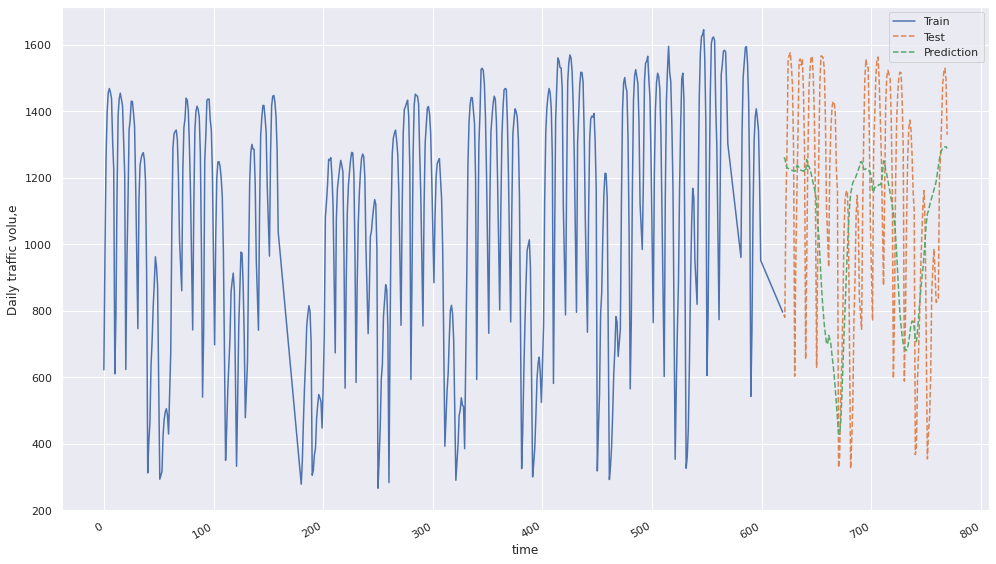

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

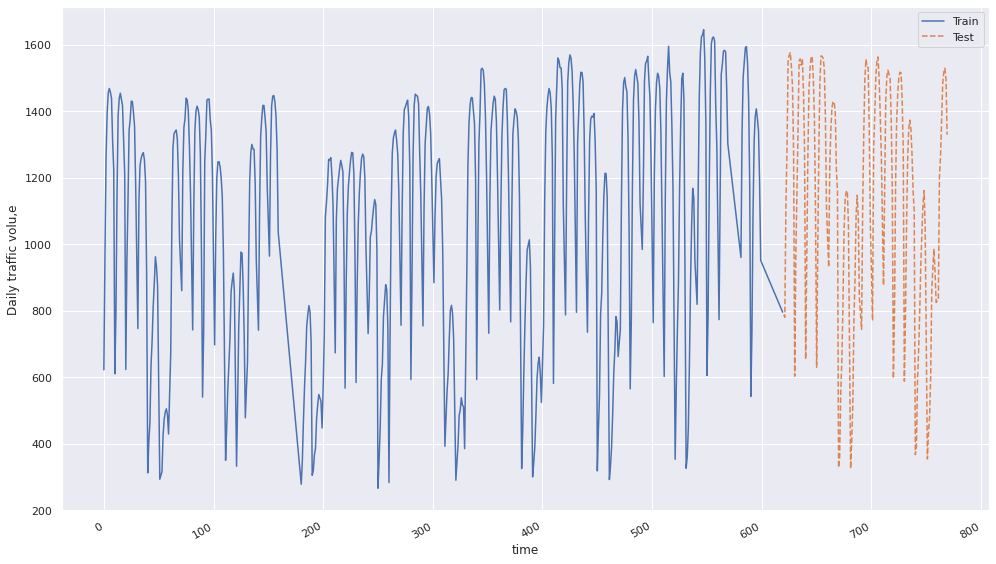

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 260.2789891963417


In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 243.46707559962363


In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

Mean absolute error: 178.03393939393942


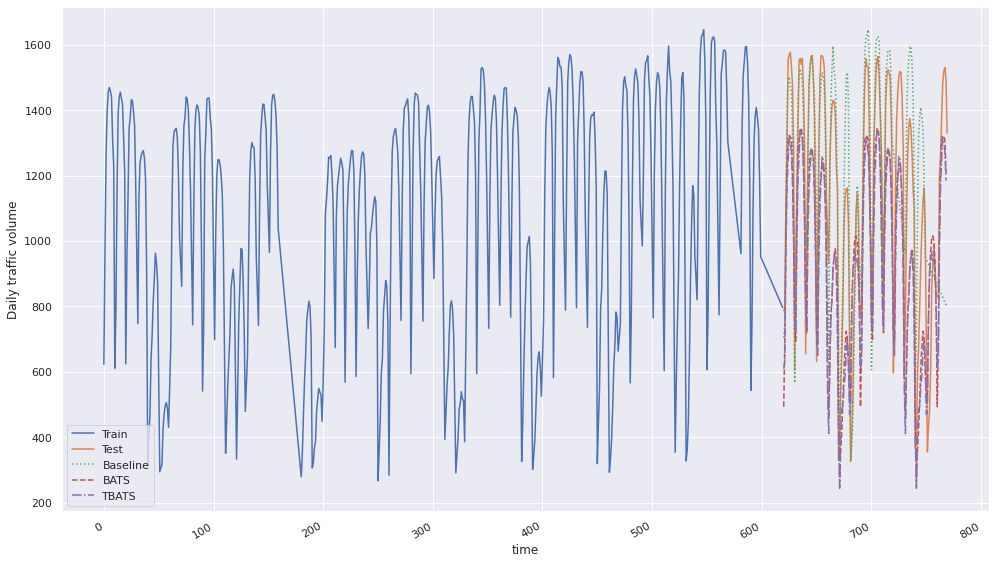

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


                               SARIMAX Results                                
Dep. Variable:                  usage   No. Observations:                  770
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -5056.631
Date:                Thu, 02 Feb 2023   AIC                          10125.262
Time:                        15:09:41   BIC                          10153.133
Sample:                             0   HQIC                         10135.989
                                - 770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3004      0.028     10.920      0.000       0.247       0.354
ar.L2         -0.1396      0.058     -2.413      0.016      -0.253      -0.026
ar.L3         -0.1343      0.076     -1.776      0.0

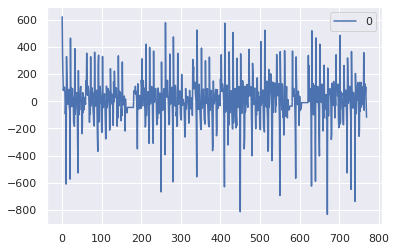

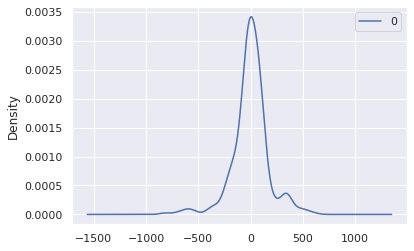

                0
count  770.000000
mean     1.976147
std    175.065844
min   -834.209632
25%    -59.557147
50%      5.825643
75%     79.412975
max    623.000000


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

predicted=798.272234, expected=788.772727
predicted=790.499427, expected=781.000000
predicted=782.726621, expected=1121.000000
predicted=1238.921326, expected=1289.000000
predicted=1291.779855, expected=1557.000000
predicted=1578.018000, expected=1569.000000
predicted=1482.589541, expected=1577.000000
predicted=1467.749871, expected=1535.000000
predicted=1466.713937, expected=1476.000000
predicted=1412.168674, expected=1278.000000
predicted=1223.555659, expected=604.000000
predicted=414.628064, expected=959.000000
predicted=1219.812862, expected=1149.000000
predicted=1268.367821, expected=1337.000000
predicted=1411.347168, expected=1552.000000
predicted=1661.927323, expected=1558.000000
predicted=1421.613093, expected=1539.000000
predicted=1454.169321, expected=1558.000000
predicted=1513.965306, expected=1459.000000
predicted=1387.796170, expected=1285.000000
predicted=1242.478591, expected=655.000000
predicted=490.234378, expected=972.000000
predicted=1194.010325, expected=1260.000000

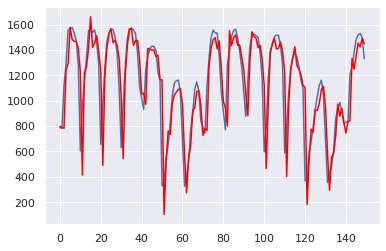

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 199.740
Test MAE: 130.271


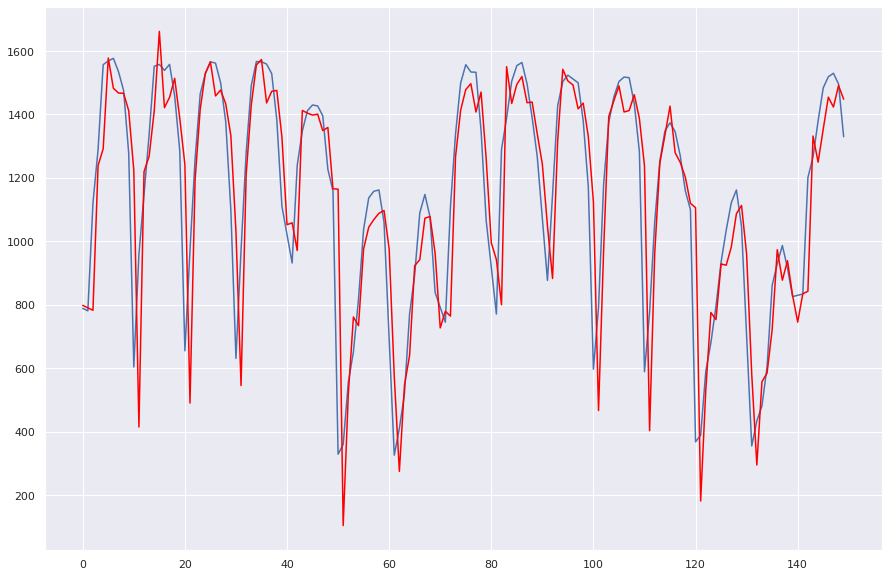

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 145.251
Test MAE: 97.495


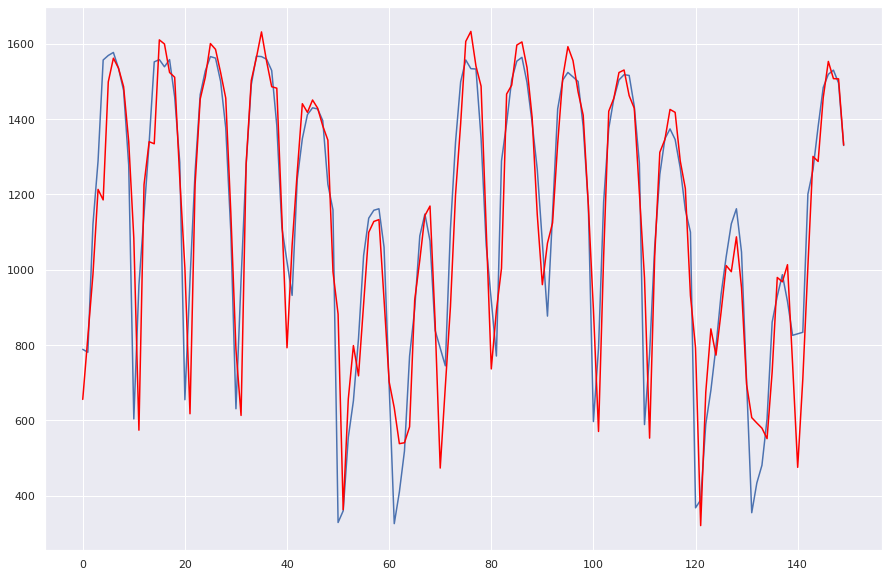

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 4s - loss: 0.0734 - 4s/epoch - 6ms/step
Epoch 2/100
609/609 - 2s - loss: 0.0364 - 2s/epoch - 3ms/step
Epoch 3/100
609/609 - 2s - loss: 0.0297 - 2s/epoch - 3ms/step
Epoch 4/100
609/609 - 2s - loss: 0.0244 - 2s/epoch - 3ms/step
Epoch 5/100
609/609 - 2s - loss: 0.0202 - 2s/epoch - 3ms/step
Epoch 6/100
609/609 - 2s - loss: 0.0174 - 2s/epoch - 3ms/step
Epoch 7/100
609/609 - 2s - loss: 0.0161 - 2s/epoch - 3ms/step
Epoch 8/100
609/609 - 2s - loss: 0.0152 - 2s/epoch - 3ms/step
Epoch 9/100
609/609 - 2s - loss: 0.0148 - 2s/epoch - 3ms/step
Epoch 10/100
609/609 - 2s - loss: 0.0145 - 2s/epoch - 3ms/step
Epoch 11/100
609/609 - 2s - loss: 0.0144 - 2s/epoch - 3ms/step
Epoch 12/100
609/609 - 2s - loss: 0.0144 - 2s/epoch - 3ms/step
Epoch 13/100
609/609 - 2s - loss: 0.0142 - 2s/epoch - 3ms/step
Epoch 14/100
609/609 - 2s - loss: 0.0139 - 2s/epoch - 3ms/step
Epoch 15/100
609/609 - 2s - loss: 0.0140 - 2s/epoch - 3ms/step
Epoch 16/100
609/609 - 2s - loss: 0.0138 - 2s/epoch - 3ms/step
E

Train Score: 120.62 RMSE
Test Score: 138.42 RMSE
Test Score: 9.48 MAE


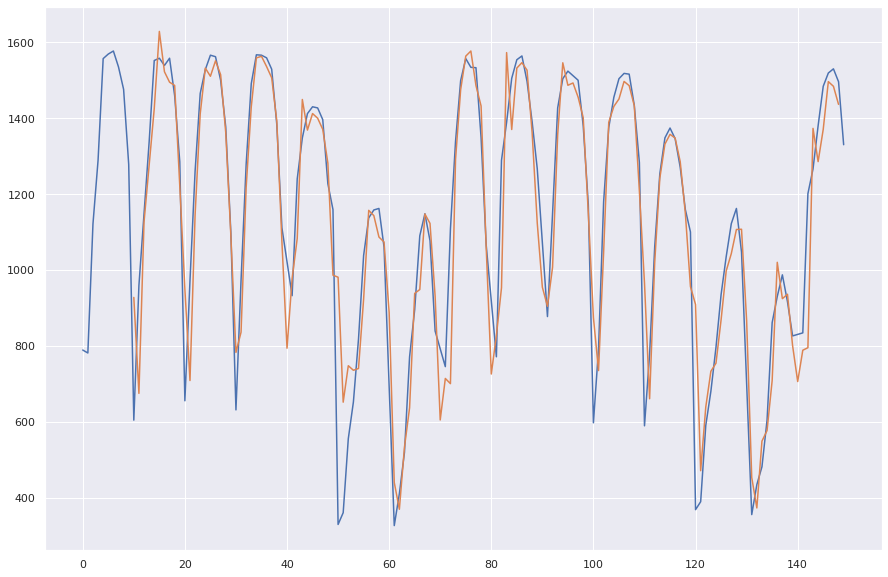

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 7s - loss: 0.0550 - 7s/epoch - 11ms/step
Epoch 2/100
609/609 - 4s - loss: 0.0198 - 4s/epoch - 6ms/step
Epoch 3/100
609/609 - 4s - loss: 0.0146 - 4s/epoch - 6ms/step
Epoch 4/100
609/609 - 4s - loss: 0.0130 - 4s/epoch - 6ms/step
Epoch 5/100
609/609 - 4s - loss: 0.0125 - 4s/epoch - 6ms/step
Epoch 6/100
609/609 - 4s - loss: 0.0111 - 4s/epoch - 6ms/step
Epoch 7/100
609/609 - 4s - loss: 0.0108 - 4s/epoch - 6ms/step
Epoch 8/100
609/609 - 4s - loss: 0.0106 - 4s/epoch - 6ms/step
Epoch 9/100
609/609 - 4s - loss: 0.0108 - 4s/epoch - 6ms/step
Epoch 10/100
609/609 - 4s - loss: 0.0102 - 4s/epoch - 6ms/step
Epoch 11/100
609/609 - 4s - loss: 0.0099 - 4s/epoch - 6ms/step
Epoch 12/100
609/609 - 4s - loss: 0.0094 - 4s/epoch - 6ms/step
Epoch 13/100
609/609 - 5s - loss: 0.0094 - 5s/epoch - 8ms/step
Epoch 14/100
609/609 - 5s - loss: 0.0094 - 5s/epoch - 8ms/step
Epoch 15/100
609/609 - 4s - loss: 0.0092 - 4s/epoch - 6ms/step
Epoch 16/100
609/609 - 4s - loss: 0.0094 - 4s/epoch - 7ms/step


Train Score: 73.89 RMSE
Test Score: 144.48 RMSE
Test Score: 9.57 MAE


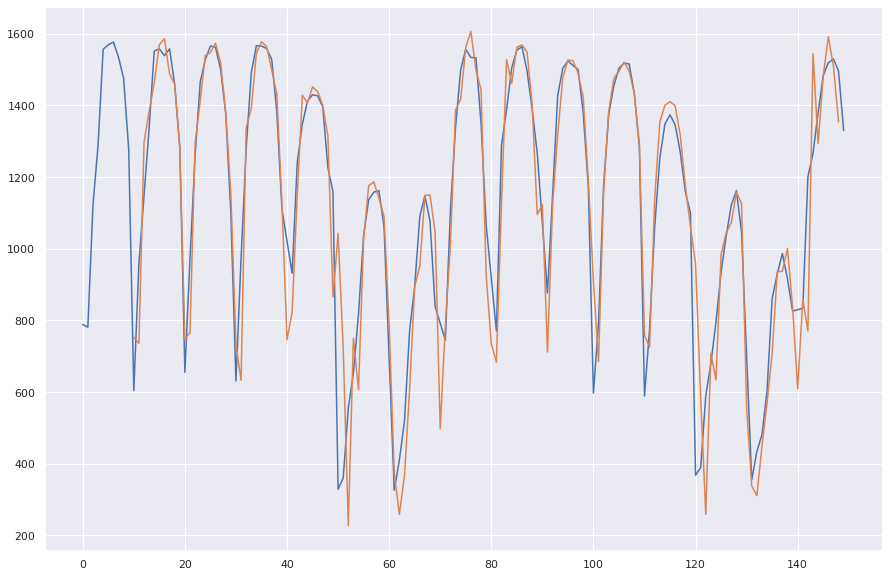

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 4

In [ ]:
df_mun=df4

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

Mean absolute error: 818.9212727272725


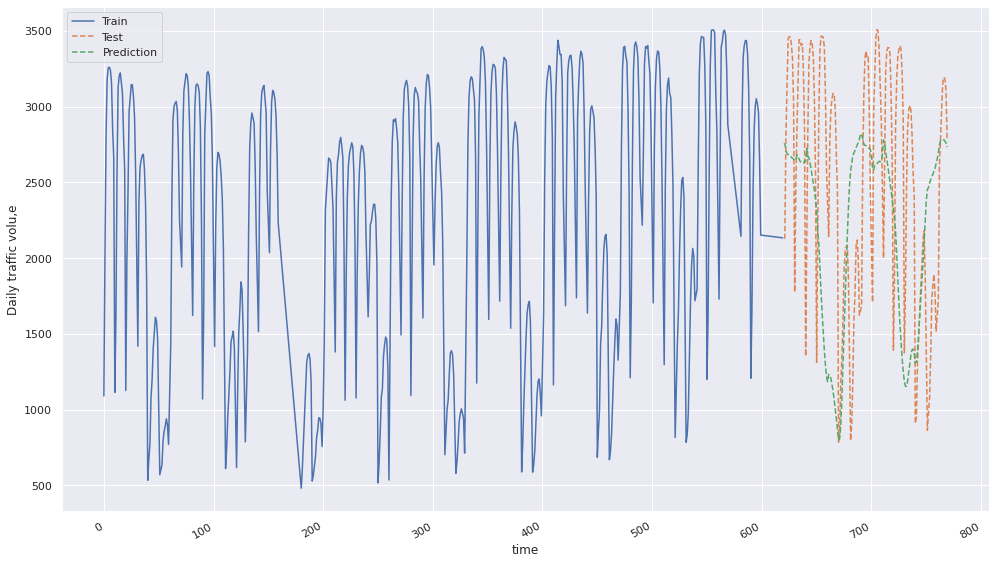

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

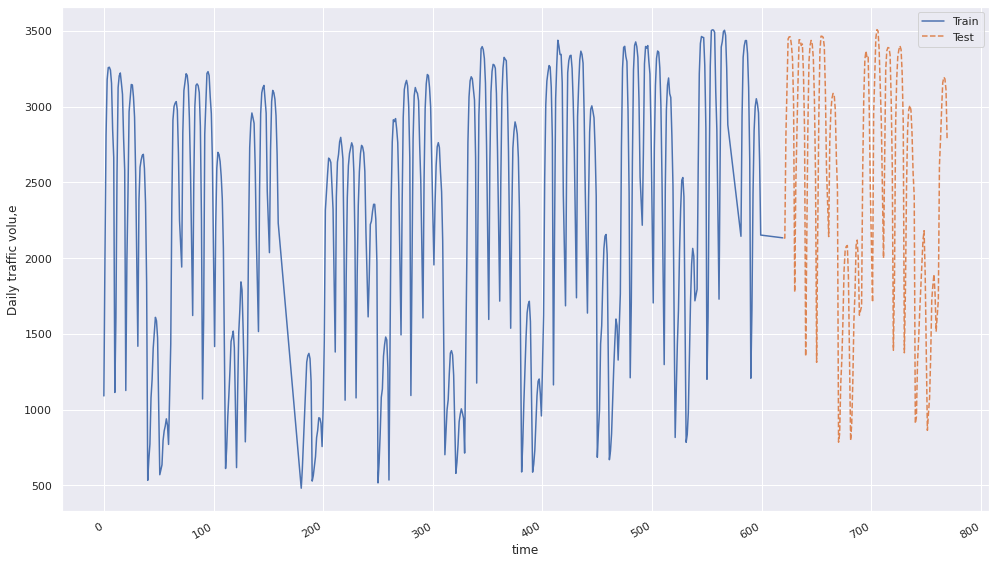

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 353.68866908257166


In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 776.6823950930766


In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

Mean absolute error: 375.1744444444445


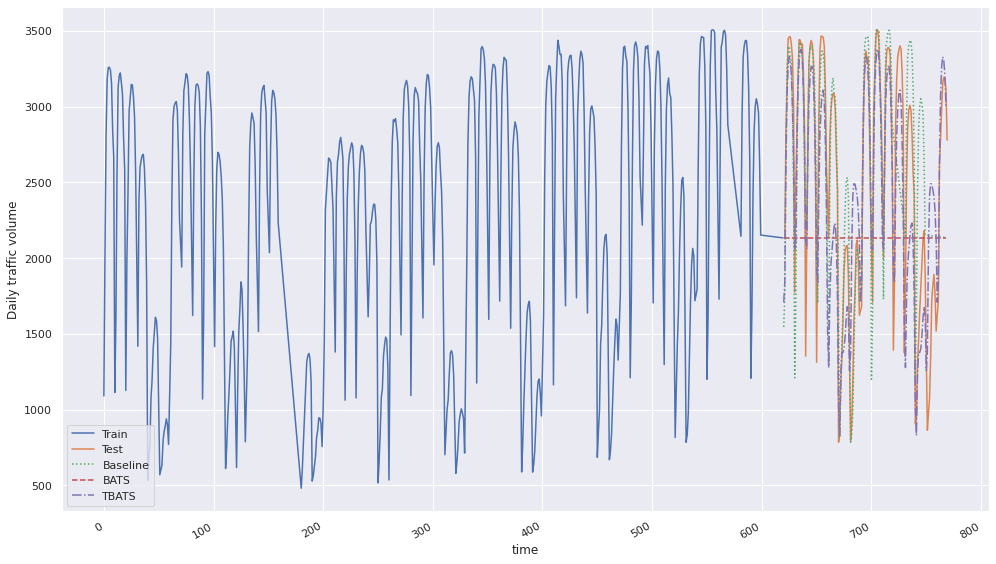

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


                               SARIMAX Results                                
Dep. Variable:                  usage   No. Observations:                  770
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -5679.777
Date:                Thu, 02 Feb 2023   AIC                          11371.554
Time:                        15:36:32   BIC                          11399.424
Sample:                             0   HQIC                         11382.280
                                - 770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2817      0.026     10.817      0.000       0.231       0.333
ar.L2         -0.1447      0.055     -2.651      0.008      -0.252      -0.038
ar.L3         -0.1295      0.083     -1.562      0.1

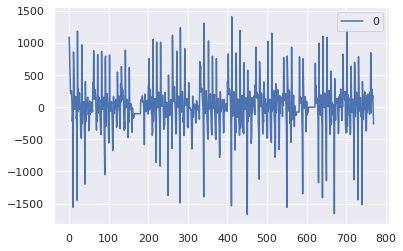

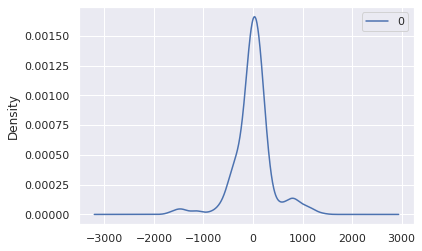

                 0
count   770.000000
mean      4.194769
std     392.435093
min   -1668.626024
25%    -129.410688
50%       9.846323
75%     151.799423
max    1404.228926


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

predicted=2133.999869, expected=2132.909091
predicted=2133.090785, expected=2132.000000
predicted=2132.181701, expected=2814.000000
predicted=3024.633799, expected=3123.000000
predicted=3110.451690, expected=3447.000000
predicted=3414.854806, expected=3461.000000
predicted=3328.008804, expected=3460.000000
predicted=3290.387384, expected=3409.000000
predicted=3321.284671, expected=3316.000000
predicted=3244.472957, expected=3018.000000
predicted=2944.400331, expected=1775.000000
predicted=1447.392971, expected=2479.000000
predicted=2934.764938, expected=2818.000000
predicted=3001.528490, expected=3154.000000
predicted=3249.323865, expected=3442.000000
predicted=3575.898599, expected=3439.000000
predicted=3218.924137, expected=3403.000000
predicted=3280.062086, expected=3413.000000
predicted=3349.040465, expected=3220.000000
predicted=3121.592292, expected=2839.000000
predicted=2756.067800, expected=1352.000000
predicted=985.142999, expected=2120.000000
predicted=2624.120702, expected=2

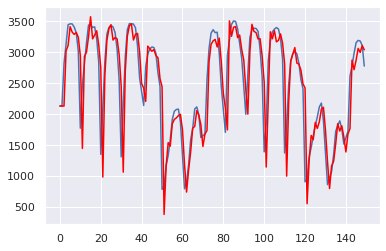

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 425.945
Test MAE: 270.573


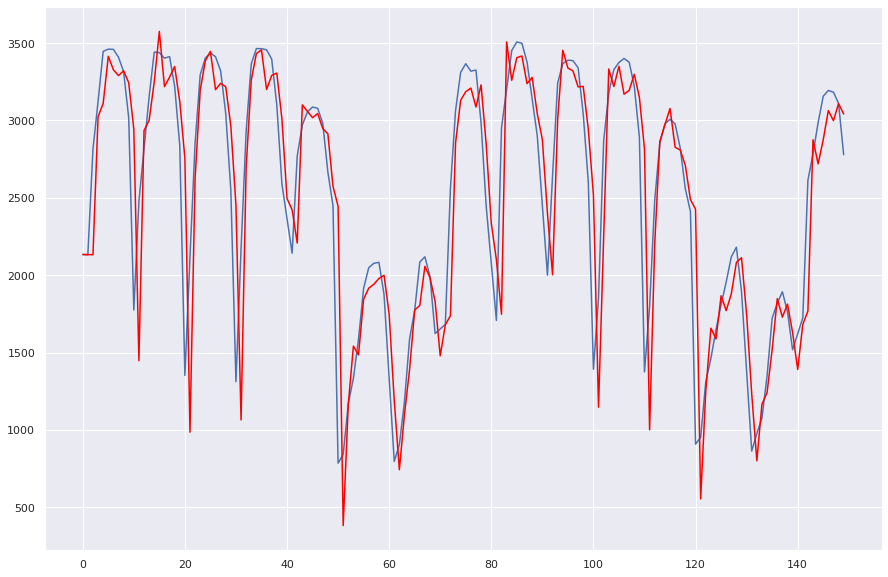

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1699.871643, expected=2132.909091


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2249.474893, expected=2132.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2729.034393, expected=2814.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3105.585499, expected=3123.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3009.574627, expected=3447.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3383.255251, expected=3461.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3515.061092, expected=3460.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3379.840135, expected=3409.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3275.727905, expected=3316.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2972.960679, expected=3018.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2603.735806, expected=1775.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1832.447632, expected=2479.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3091.099372, expected=2818.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3230.085971, expected=3154.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3033.223816, expected=3442.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3462.520691, expected=3439.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3518.749746, expected=3403.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3345.313594, expected=3413.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3253.321179, expected=3220.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2879.115264, expected=2839.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2351.676038, expected=1352.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1383.942864, expected=2120.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2652.300318, expected=2853.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3252.247656, expected=3295.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3185.115413, expected=3403.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3490.849896, expected=3437.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3508.226176, expected=3412.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3374.427849, expected=3321.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3213.413959, expected=3046.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2710.964294, expected=2548.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1917.679871, expected=1312.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1318.368032, expected=2168.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2795.976850, expected=2933.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3407.799154, expected=3366.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3362.681223, expected=3465.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3550.014030, expected=3464.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3510.882246, expected=3457.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3380.007267, expected=3397.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3310.766215, expected=3101.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2666.411417, expected=2590.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1907.906712, expected=2366.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2366.621835, expected=2142.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2808.461784, expected=2771.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3192.356284, expected=2971.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3000.681123, expected=3055.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3118.984396, expected=3087.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3162.159418, expected=3079.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3020.572970, expected=2982.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2862.975491, expected=2666.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2227.053527, expected=2451.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1829.928063, expected=785.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=813.602900, expected=841.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1440.009421, expected=1170.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1691.630609, expected=1334.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1323.453711, expected=1586.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1727.303940, expected=1915.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2052.739361, expected=2048.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2034.017938, expected=2077.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1994.862149, expected=2083.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1682.240264, expected=1874.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1196.051208, expected=1335.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1280.161961, expected=796.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1377.042553, expected=905.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1201.011465, expected=1183.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1172.537036, expected=1588.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1767.461053, expected=1771.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1962.442402, expected=2085.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2105.456902, expected=2119.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2081.527847, expected=1991.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1606.033011, expected=1623.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=980.938363, expected=1652.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1580.941939, expected=1682.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2187.994242, expected=2562.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2785.139648, expected=3063.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3065.684784, expected=3311.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3455.179263, expected=3367.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3543.931771, expected=3319.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3287.320879, expected=3326.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3187.498025, expected=2984.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2551.830407, expected=2447.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1826.544715, expected=2077.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2062.994863, expected=1708.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2266.144642, expected=2952.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3258.142196, expected=3203.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3311.108625, expected=3452.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3577.438828, expected=3508.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3678.036952, expected=3499.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3426.545508, expected=3378.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3227.348709, expected=3138.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2681.789801, expected=2902.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2296.014037, expected=2451.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2437.877314, expected=2000.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2558.359802, expected=2645.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2969.025317, expected=3242.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3337.911874, expected=3368.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3558.783467, expected=3390.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3524.437530, expected=3387.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3300.168694, expected=3341.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3168.066344, expected=3043.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2614.087009, expected=2601.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2016.613325, expected=1392.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1352.775528, expected=1854.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2372.848711, expected=2866.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3296.477829, expected=3177.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3288.385164, expected=3329.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3505.484598, expected=3375.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3480.569042, expected=3401.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3290.855025, expected=3377.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3206.743697, expected=3222.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2780.296071, expected=2893.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2252.328109, expected=1375.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1284.321540, expected=1797.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2345.417468, expected=2482.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2988.544594, expected=2854.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2955.207537, expected=2978.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3150.185807, expected=3008.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3119.732412, expected=2978.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2873.891349, expected=2822.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2712.450088, expected=2558.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2129.637640, expected=2411.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1714.063494, expected=908.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=810.600958, expected=952.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1553.010667, expected=1311.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1789.728635, expected=1461.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1589.096489, expected=1647.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1849.049623, expected=1809.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1937.279582, expected=1956.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1847.417644, expected=2119.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2053.246736, expected=2181.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1784.223798, expected=1894.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1155.502800, expected=1378.500000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1219.916168, expected=863.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1436.344039, expected=977.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1349.311550, expected=1076.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1171.585962, expected=1348.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1553.388700, expected=1723.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1855.130834, expected=1819.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1748.977731, expected=1893.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1861.112453, expected=1764.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1421.585178, expected=1518.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=842.333054, expected=1621.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=1492.030530, expected=1724.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2240.723085, expected=2613.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2897.799934, expected=2785.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2832.400121, expected=2986.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3120.589502, expected=3157.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3252.582153, expected=3194.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3117.570377, expected=3183.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=3106.657944, expected=3111.000000


/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=2736.636563, expected=2779.000000
Test RMSE: 302.241
Test MAE: 207.796


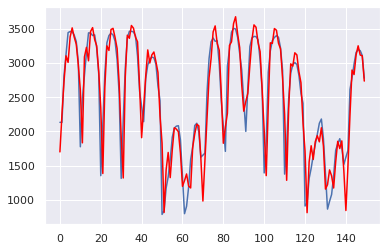

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 302.241
Test MAE: 207.796


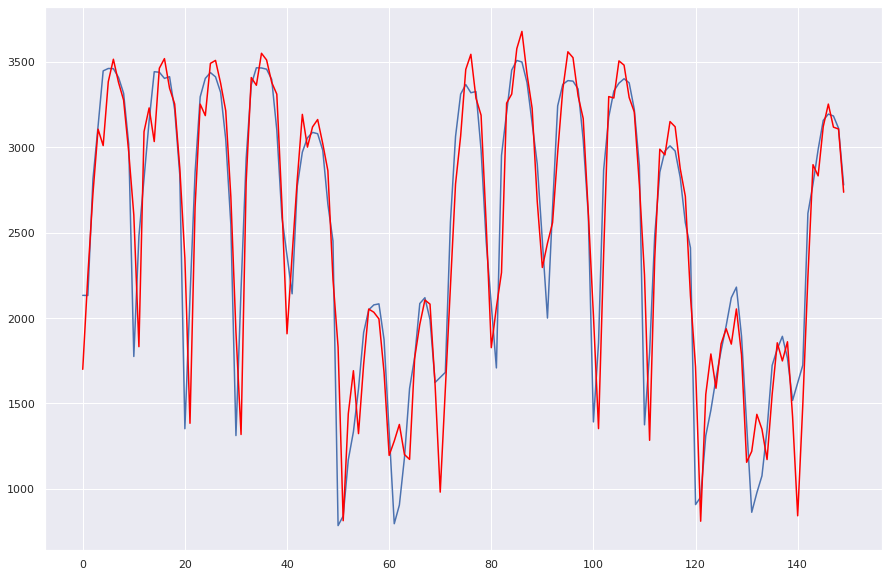

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 3s - loss: 0.0820 - 3s/epoch - 5ms/step
Epoch 2/100
609/609 - 2s - loss: 0.0439 - 2s/epoch - 3ms/step
Epoch 3/100
609/609 - 2s - loss: 0.0370 - 2s/epoch - 3ms/step
Epoch 4/100
609/609 - 2s - loss: 0.0307 - 2s/epoch - 3ms/step
Epoch 5/100
609/609 - 2s - loss: 0.0252 - 2s/epoch - 3ms/step
Epoch 6/100
609/609 - 2s - loss: 0.0200 - 2s/epoch - 3ms/step
Epoch 7/100
609/609 - 2s - loss: 0.0172 - 2s/epoch - 3ms/step
Epoch 8/100
609/609 - 2s - loss: 0.0154 - 2s/epoch - 3ms/step
Epoch 9/100
609/609 - 2s - loss: 0.0148 - 2s/epoch - 3ms/step
Epoch 10/100
609/609 - 2s - loss: 0.0142 - 2s/epoch - 3ms/step
Epoch 11/100
609/609 - 2s - loss: 0.0139 - 2s/epoch - 3ms/step
Epoch 12/100
609/609 - 2s - loss: 0.0136 - 2s/epoch - 3ms/step
Epoch 13/100
609/609 - 2s - loss: 0.0135 - 2s/epoch - 3ms/step
Epoch 14/100
609/609 - 2s - loss: 0.0128 - 2s/epoch - 3ms/step
Epoch 15/100
609/609 - 2s - loss: 0.0126 - 2s/epoch - 3ms/step
Epoch 16/100
609/609 - 2s - loss: 0.0122 - 2s/epoch - 3ms/step
E

Train Score: 257.45 RMSE
Test Score: 288.55 RMSE
Test Score: 13.54 MAE


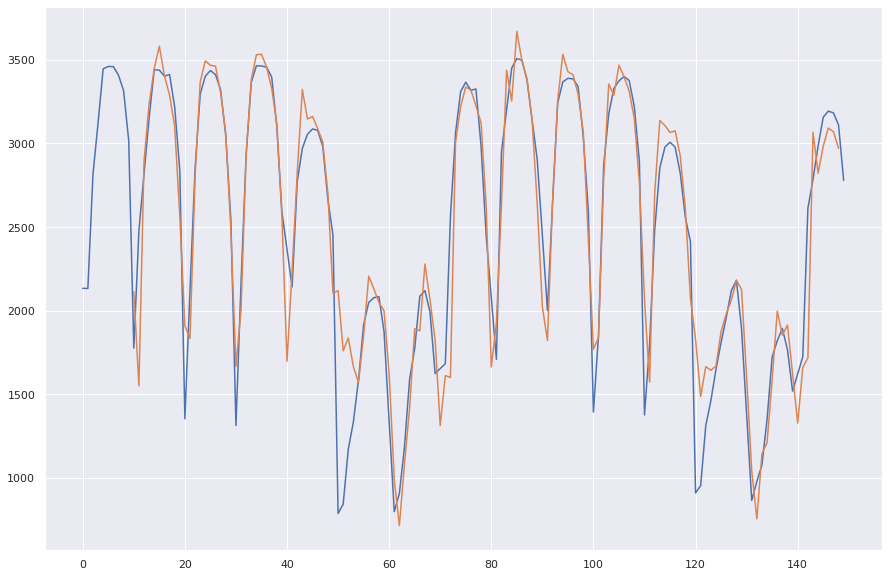

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


Epoch 1/100
609/609 - 7s - loss: 0.0576 - 7s/epoch - 11ms/step
Epoch 2/100
609/609 - 4s - loss: 0.0211 - 4s/epoch - 6ms/step
Epoch 3/100
609/609 - 4s - loss: 0.0164 - 4s/epoch - 6ms/step
Epoch 4/100
609/609 - 4s - loss: 0.0139 - 4s/epoch - 6ms/step
Epoch 5/100
609/609 - 4s - loss: 0.0130 - 4s/epoch - 6ms/step
Epoch 6/100
609/609 - 4s - loss: 0.0111 - 4s/epoch - 6ms/step
Epoch 7/100
609/609 - 4s - loss: 0.0111 - 4s/epoch - 6ms/step
Epoch 8/100
609/609 - 4s - loss: 0.0099 - 4s/epoch - 6ms/step
Epoch 9/100
609/609 - 4s - loss: 0.0102 - 4s/epoch - 6ms/step
Epoch 10/100
609/609 - 4s - loss: 0.0098 - 4s/epoch - 6ms/step
Epoch 11/100
609/609 - 4s - loss: 0.0096 - 4s/epoch - 6ms/step
Epoch 12/100
609/609 - 4s - loss: 0.0092 - 4s/epoch - 6ms/step
Epoch 13/100
609/609 - 4s - loss: 0.0094 - 4s/epoch - 6ms/step
Epoch 14/100
609/609 - 4s - loss: 0.0091 - 4s/epoch - 6ms/step
Epoch 15/100
609/609 - 4s - loss: 0.0090 - 4s/epoch - 6ms/step
Epoch 16/100
609/609 - 4s - loss: 0.0089 - 4s/epoch - 6ms/step


Train Score: 185.38 RMSE
Test Score: 294.86 RMSE
Test Score: 14.41 MAE


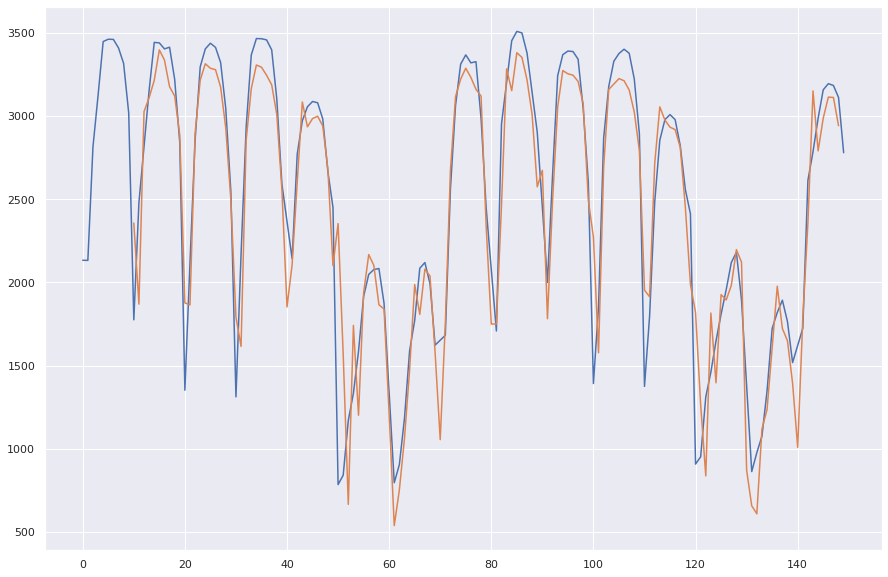

In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 5

In [ ]:
df_mun=df5

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

Mean absolute error: 89.67675757575759


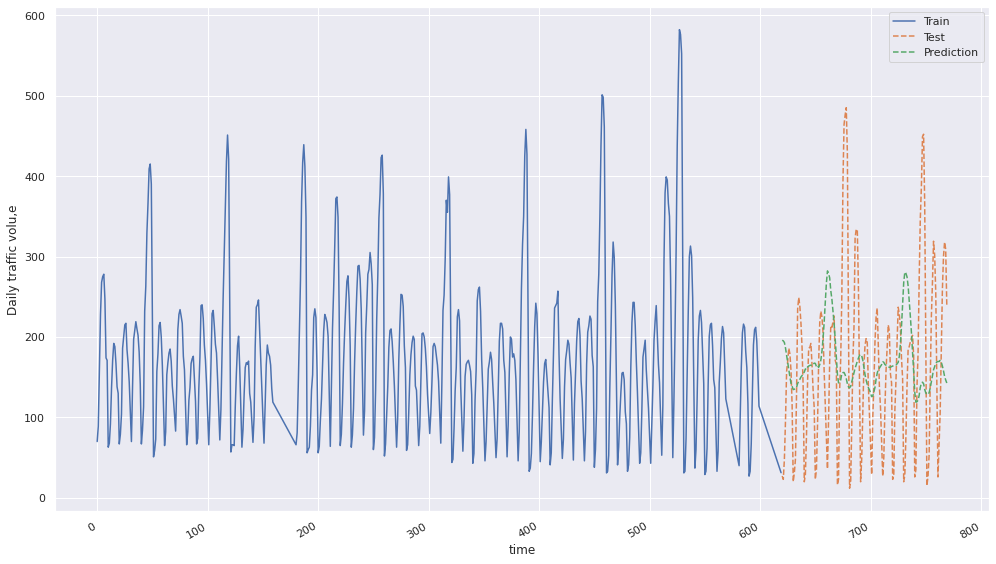

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

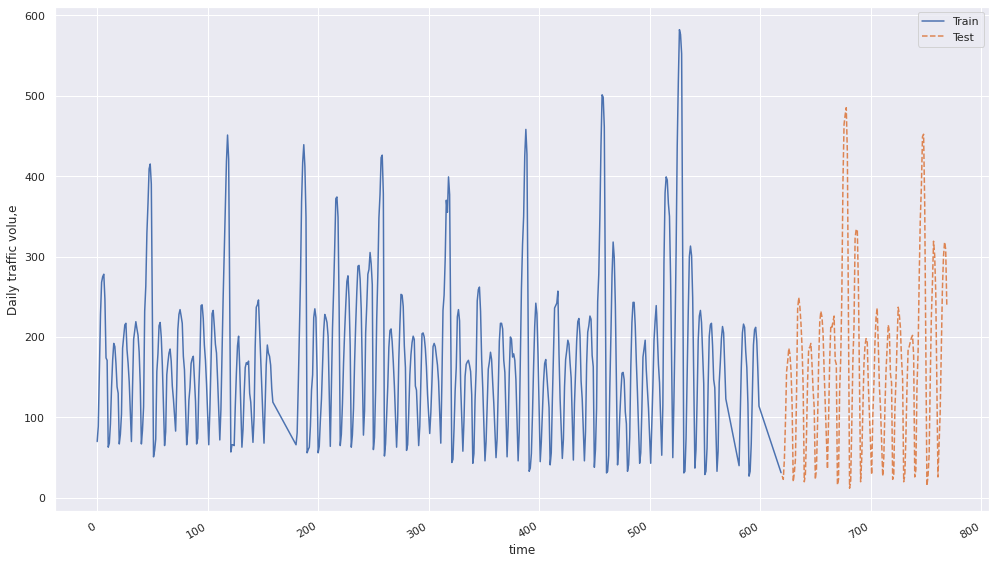

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 90.11594885157358


In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

Mean absolute error: 130.55803175692296


In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

Mean absolute error: 58.6640404040404


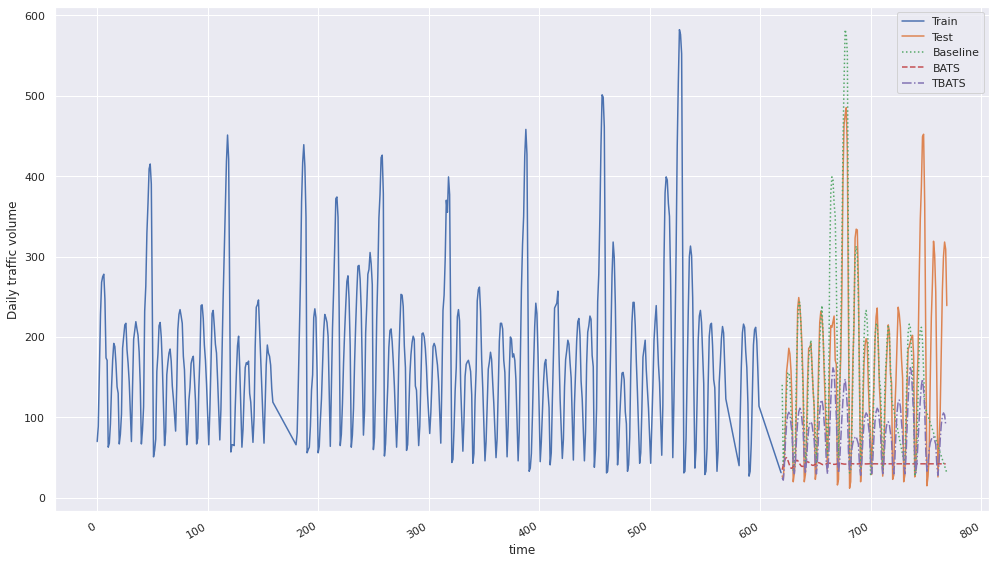

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


                               SARIMAX Results                                
Dep. Variable:                  usage   No. Observations:                  770
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -3972.481
Date:                Thu, 02 Feb 2023   AIC                           7956.963
Time:                        16:05:28   BIC                           7984.833
Sample:                             0   HQIC                          7967.689
                                - 770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4593      0.021     21.668      0.000       0.418       0.501
ar.L2         -0.1368      0.035     -3.938      0.000      -0.205      -0.069
ar.L3         -0.1234      0.043     -2.857      0.0

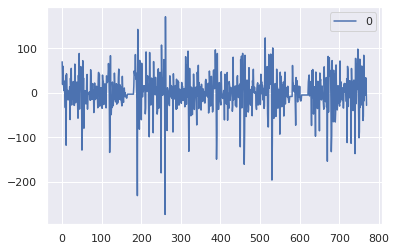

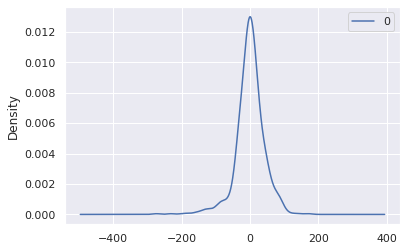

                0
count  770.000000
mean     0.280574
std     42.442711
min   -274.146641
25%    -17.830996
50%      0.753124
75%     20.946351
max    171.567276


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

predicted=32.002982, expected=27.136364
predicted=27.866465, expected=23.000000
predicted=23.729947, expected=48.000000
predicted=62.217677, expected=96.000000
predicted=117.047787, expected=157.000000
predicted=176.766611, expected=170.000000
predicted=160.340637, expected=186.000000
predicted=172.126244, expected=179.000000
predicted=153.649665, expected=158.000000
predicted=128.163799, expected=115.000000
predicted=93.973162, expected=20.000000
predicted=-19.699873, expected=31.000000
predicted=58.399005, expected=48.000000
predicted=77.629227, expected=129.000000
predicted=181.520546, expected=235.000000
predicted=298.018784, expected=249.000000
predicted=225.217677, expected=238.000000
predicted=204.431948, expected=217.000000
predicted=175.498789, expected=187.000000
predicted=146.010237, expected=137.000000
predicted=117.644832, expected=20.000000
predicted=-18.852119, expected=29.000000
predicted=63.938995, expected=77.000000
predicted=127.619279, expected=145.000000
predicted=

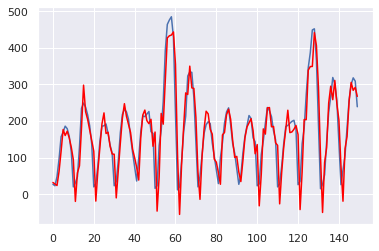

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

Test RMSE: 46.220
Test MAE: 34.681


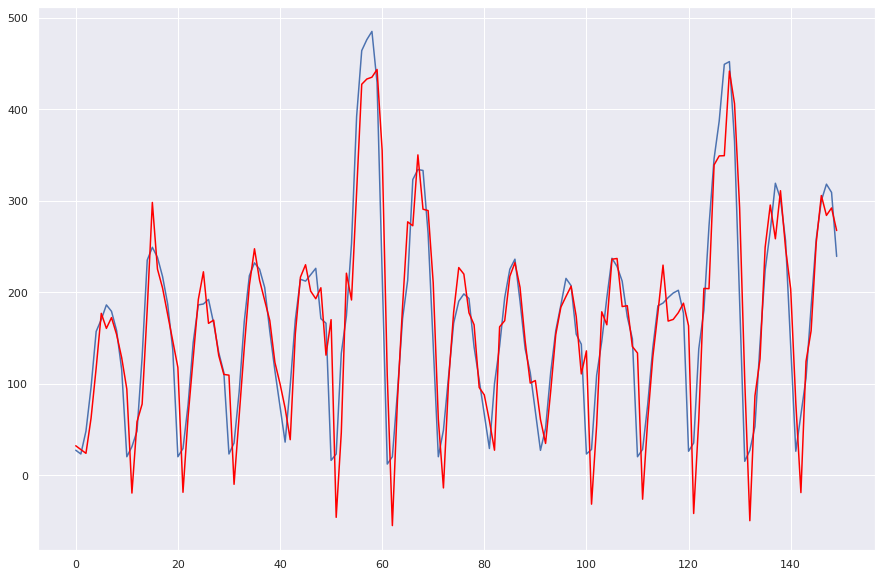

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

/usr/local/lib/python3.8/dist-packages/statsmodels/base/model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


predicted=242.597883, expected=224.000000


In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 6

In [ ]:
df_mun=df6

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 7

In [ ]:
df_mun=df7

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 8

In [ ]:
df_mun=df8

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

#Municipality 9

In [ ]:
df_mun=df9

split_date='2017-08-05'
split_index= df_mun.index[df_mun['date'] >= split_date].tolist()[0] #'2017-08-05'   

##Moving Average

In [ ]:
train=df_mun[:split_index]
test=df_mun[split_index:]
# Train a simple moving average model on the training data
window_size = 10 # one day
predictions = []

for i in range(len(test)):
    moving_avg = np.mean(train[i:i+window_size])
    predictions.append(moving_avg)
        
# Evaluate the accuracy of the predictions
test['predictions'] = predictions
error = np.mean(np.abs(test['usage'] - test['predictions']))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(train.usage, ls='-', label='Train')
ax.plot(test.usage, ls='--', label='Test')
ax.plot(test.predictions, ls='--', label='Prediction')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

## BATS TBATS

In [ ]:
y = df_mun['usage']
fh = np.arange(1, 150)

In [ ]:

from sktime.forecasting.model_selection import temporal_train_test_split
y_train, y_test = temporal_train_test_split(y, test_size=150)

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))

ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='--', label='Test')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volu,e')
ax.legend(loc='best')

fig.autofmt_xdate()
plt.tight_layout()

plt.show()

In [ ]:
y_pred_baseline = y_train[-150:].values

In [ ]:
from sktime.forecasting.bats import BATS

forecaster = BATS(use_box_cox=True,
                  use_trend=False,
                  use_damped_trend=False,
                  sp=[10, 70])
forecaster.fit(y_train)

y_pred_BATS = forecaster.predict(fh)

In [ ]:
from sktime.forecasting.tbats import TBATS
forecaster = TBATS(use_box_cox=True,
                   use_trend=False,
                   use_damped_trend=False,
                   sp=[10, 70])
forecaster.fit(y_train)
y_pred_TBATS = forecaster.predict(fh)

In [ ]:
error = np.mean(np.abs(y_test - y_pred_TBATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_BATS))
print(f"Mean absolute error: {error}")

In [ ]:
error = np.mean(np.abs(y_test - y_pred_baseline))
print(f"Mean absolute error: {error}")

In [ ]:
fig, ax = plt.subplots(figsize=(14, 8))
ax.plot(y_train, ls='-', label='Train')
ax.plot(y_test, ls='-', label='Test')
ax.plot(y_test.index, y_pred_baseline, ls=':', label='Baseline')
ax.plot(y_pred_BATS, ls='--', label='BATS')
ax.plot(y_pred_TBATS, ls='-.', label='TBATS')
ax.set_xlabel('time')
ax.set_ylabel('Daily traffic volume')
ax.legend(loc='best')
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

##ARIMA


In [ ]:
# fit an ARIMA model and plot residual errors
from pandas import datetime
from pandas import read_csv
from pandas import DataFrame
from statsmodels.tsa.arima.model import ARIMA
from matplotlib import pyplot

series = df_mun.usage

# fit model
model = ARIMA(series, order=(5,1,0))
model_fit = model.fit()
# summary of fit model
print(model_fit.summary())
# line plot of residuals
residuals = DataFrame(model_fit.resid)
residuals.plot()
pyplot.show()
# density plot of residuals
residuals.plot(kind='kde')
pyplot.show()
# summary stats of residuals
print(residuals.describe())

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(5,1,0))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
print('Test RMSE: %.3f' % rmse)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
# evaluate an ARIMA model using a walk-forward validation
from pandas import read_csv
from pandas import datetime
from matplotlib import pyplot
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_squared_error
from math import sqrt
# load dataset
series = df_mun.usage
# split into train and test sets
X = series.values

train, test = X[0:-150], X[-150:]
history = [x for x in train]
predictions = list()
# walk-forward validation
for t in range(len(test)):
	model = ARIMA(history, order=(7,1,10))
	model_fit = model.fit()
	output = model_fit.forecast()
	yhat = output[0]
	predictions.append(yhat)
	obs = test[t]
	history.append(obs)
	print('predicted=%f, expected=%f' % (yhat, obs))
# evaluate forecasts
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)
# plot forecasts against actual outcomes
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

In [ ]:
rmse = sqrt(mean_squared_error(test, predictions))
mae = mean_absolute_error(test, predictions)
print('Test RMSE: %.3f' % rmse)
print('Test MAE: %.3f' % mae)

In [ ]:
pyplot.figure(figsize=(15,10))
pyplot.plot(test)
pyplot.plot(predictions, color='red')
pyplot.show()

## LSTM

### one layer

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = Sequential()
model.add(LSTM(4, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()

### Complex

In [ ]:
# LSTM for international airline passengers problem with time step regression framing
import numpy as np
import matplotlib.pyplot as plt
from pandas import read_csv
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
# convert an array of values into a dataset matrix
def create_dataset(dataset, look_back=1):
 dataX, dataY = [], []
 for i in range(len(dataset)-look_back-1):
  a = dataset[i:(i+look_back), 0]
  dataX.append(a)
  dataY.append(dataset[i + look_back, 0])
 return np.array(dataX), np.array(dataY)

dataset = df_mun.usage
dataset = np.array(dataset).reshape(-1,1)
# normalize the dataset
scaler = MinMaxScaler(feature_range=(0, 1))
dataset = scaler.fit_transform(dataset)
# split into train and test sets
train_size = split_index
test_size = len(dataset) - train_size
train, test = dataset[0:train_size,:], dataset[train_size:len(dataset),:]
# reshape into X=t and Y=t+1
look_back = 10
trainX, trainY = create_dataset(train, look_back)
testX, testY = create_dataset(test, look_back)
# reshape input to be [samples, time steps, features]
trainX = np.reshape(trainX, (trainX.shape[0], trainX.shape[1], 1))
testX = np.reshape(testX, (testX.shape[0], testX.shape[1], 1))

# create and fit the LSTM network
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(units=50, return_sequences=True, input_shape=(trainX.shape[1], 1)))
model.add(tf.keras.layers.LSTM(units=50))
model.add(tf.keras.layers.Dense(units=1))
model.compile(loss="mean_squared_error", optimizer="adam")

model.fit(trainX, trainY, epochs=100, batch_size=1, verbose=2)

# make predictions
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)
# invert predictions
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

# shift train predictions for plotting
trainPredictPlot = np.empty_like(dataset)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[look_back:len(trainPredict)+look_back, :] = trainPredict
# shift test predictions for plotting
testPredictPlot = np.empty_like(dataset)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(look_back*2)+1:len(dataset)-1, :] = testPredict


In [ ]:
# calculate root mean squared error
trainScore = np.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train Score: %.2f RMSE' % (trainScore))
testScore = np.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f RMSE' % (testScore))
testScore = np.sqrt(mean_absolute_error(testY[0], testPredict[:,0]))
print('Test Score: %.2f MAE' % (testScore))

plt.figure(figsize=(15,10))
plt.plot(scaler.inverse_transform(dataset)[split_index:])
#plt.plot(trainPredictPlot)
plt.plot(testPredictPlot[split_index:])
plt.show()